In [1]:
from scipy.io import arff
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
import os
from sklearn.model_selection import cross_val_score

# Preprocessing

In [2]:
data = pd.DataFrame()
for file in os.listdir("./data/terremotos/"):
    ds_arf = arff.loadarff("./data/terremotos/"+file)
    ds = pd.DataFrame(ds_arf[0])
    data = pd.concat([data, ds])
    

In [4]:
data.class5.value_counts()

b'0'    739
b'1'    255
Name: class5, dtype: int64

In [3]:
data.shape

(994, 95)

In [5]:
data = data.dropna()
data.shape

(991, 95)

In [6]:
data_cols = list(data.columns[ data.columns != 'class5' ])
label_cols = ['class5']
data[label_cols] = data[label_cols].astype('int')

In [7]:
# Standardize data
data[data_cols] = StandardScaler().fit(data[data_cols]).transform(data[data_cols])

In [24]:
def xgbo_cv(X,y):
    xg_reg = xgb.XGBClassifier(object="binary:logistic")
    
    print('Accuracy XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='accuracy', n_jobs=-1).mean()))
    print('F1-Score XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='f1', n_jobs=-1).mean()))
    print('ROC AUC XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring = 'roc_auc', n_jobs=-1).mean()))

# GAN setup and training

In [28]:
import CGAN

# For reloading after making changes
import importlib
importlib.reload(CGAN) 
from CGAN import *


rand_dim = 100 
base_n_count = 30 

nb_steps = 50000+1 # 50000 # Add one for logging of the last interval
batch_size = 64 

k_d = 1  # number of critic network updates per adversarial training step
k_g = 1  # number of generator network updates per adversarial training step
critic_pre_train_steps = 100 # 100  # number of steps to pre-train the critic before starting adversarial training
log_interval = 100  # interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 5e-5 
data_dir = './cache/terremotos/'
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

show = True 

train = data.copy().reset_index(drop=True)

train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

data_dim:  94
data_cols:  ['x1_bM', 'x2_bM', 'x3_bM', 'x4_bM', 'x5_bM', 'x6_indep_bM', 'x7_bM', 'T3.6_indep_bM', 'T3.7_indep_bM', 'T3.8_indep_bM', 'T3.9_indep_bM', 'T4_indep_bM', 'T4.1_indep_bM', 'T4.2_indep_bM', 'T4.3_indep_bM', 'T4.4_indep_bM', 'T4.5_indep_bM', 'T4.6_indep_bM', 'T4.7_indep_bM', 'T4.8_indep_bM', 'T4.9_indep_bM', 'T5_indep_bM', 'T5.1_indep_bM', 'T5.2_indep_bM', 'T5.3_indep_bM', 'T5.4_indep_bM', 'T5.5_indep_bM', 'T5.6_indep_bM', 'T5.7_indep_bM', 'T5.8_indep_bM', 'T5.9_indep_bM', 'T6_indep_bM', 'T6.1_indep_bM', 'T6.2_indep_bM', 'Mmean_indep_bM', 'dE12_indep_bM', 'bM', 'a_bM', 'eta_bM', 'deltaM_bM', 'mu3.6_indep_bM', 'mu3.7_indep_bM', 'mu3.8_indep_bM', 'mu3.9_indep_bM', 'mu4_indep_bM', 'mu4.1_indep_bM', 'mu4.2_indep_bM', 'mu4.3_indep_bM', 'mu4.4_indep_bM', 'mu4.5_indep_bM', 'mu4.6_indep_bM', 'mu4.7_indep_bM', 'mu4.8_indep_bM', 'mu4.9_indep_bM', 'mu5_indep_bM', 'mu5.1_indep_bM', 'mu5.2_indep_bM', 'mu5.3_indep_bM', 'mu5.4_indep_bM', 'mu5.5_indep_bM', 'mu5.6_indep_bM', 'mu5.

C:\Programas\Anaconda3\lib\site-packages\keras\engine\training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Step: 0 of 50001.
Losses: G, D Gen, D Real: 0.6841, 0.7002, 0.6737
D Real - D Gen: -0.0265


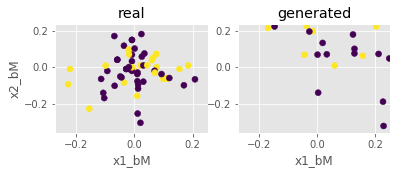

Step: 100 of 50001.
Losses: G, D Gen, D Real: 0.7379, 0.6580, 0.6725
D Real - D Gen: 0.0145


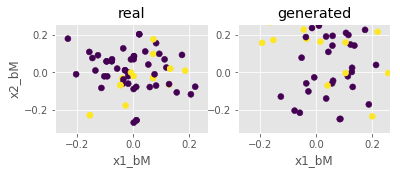

Step: 200 of 50001.
Losses: G, D Gen, D Real: 0.7631, 0.6208, 0.6513
D Real - D Gen: 0.0305


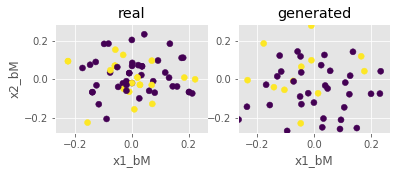

Step: 300 of 50001.
Losses: G, D Gen, D Real: 0.7737, 0.6399, 0.6412
D Real - D Gen: 0.0013


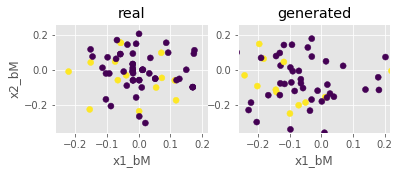

Step: 400 of 50001.
Losses: G, D Gen, D Real: 0.7485, 0.6536, 0.6288
D Real - D Gen: -0.0248


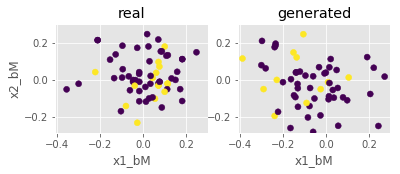

Step: 500 of 50001.
Losses: G, D Gen, D Real: 0.7234, 0.6419, 0.6321
D Real - D Gen: -0.0099


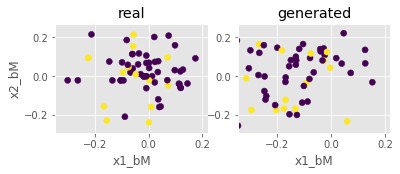

Step: 600 of 50001.
Losses: G, D Gen, D Real: 0.6936, 0.7038, 0.6377
D Real - D Gen: -0.0661


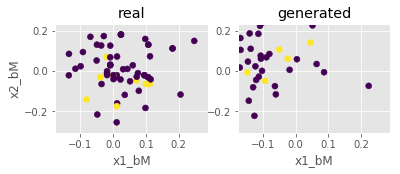

Step: 700 of 50001.
Losses: G, D Gen, D Real: 0.7747, 0.6285, 0.6498
D Real - D Gen: 0.0213


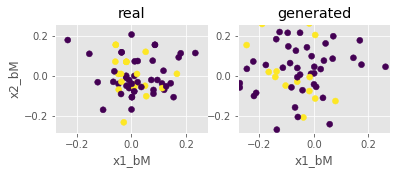

Step: 800 of 50001.
Losses: G, D Gen, D Real: 0.9085, 0.5368, 0.6335
D Real - D Gen: 0.0967


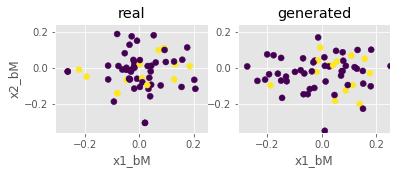

Step: 900 of 50001.
Losses: G, D Gen, D Real: 0.9322, 0.5070, 0.6045
D Real - D Gen: 0.0975


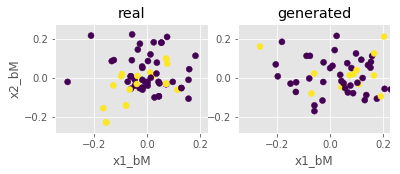

Step: 1000 of 50001.
Losses: G, D Gen, D Real: 0.9511, 0.5280, 0.5951
D Real - D Gen: 0.0671


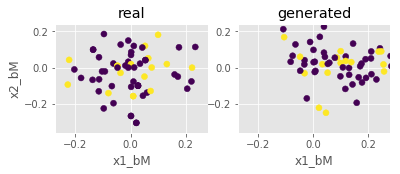

Step: 1100 of 50001.
Losses: G, D Gen, D Real: 0.9423, 0.5145, 0.5742
D Real - D Gen: 0.0598


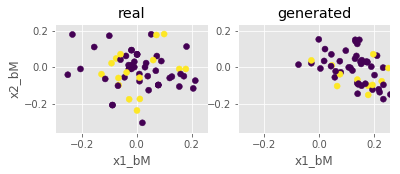

Step: 1200 of 50001.
Losses: G, D Gen, D Real: 0.8639, 0.5377, 0.5898
D Real - D Gen: 0.0521


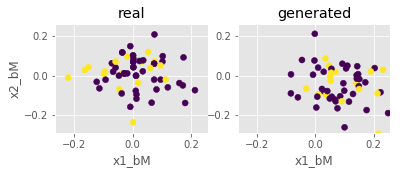

Step: 1300 of 50001.
Losses: G, D Gen, D Real: 0.8520, 0.5674, 0.5728
D Real - D Gen: 0.0054


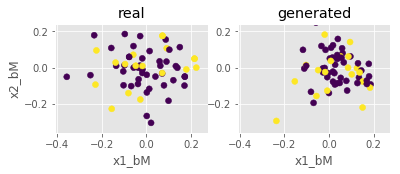

Step: 1400 of 50001.
Losses: G, D Gen, D Real: 0.8592, 0.5521, 0.5758
D Real - D Gen: 0.0237


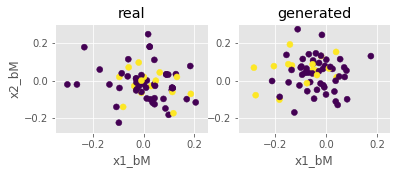

Step: 1500 of 50001.
Losses: G, D Gen, D Real: 0.9206, 0.5367, 0.6234
D Real - D Gen: 0.0866


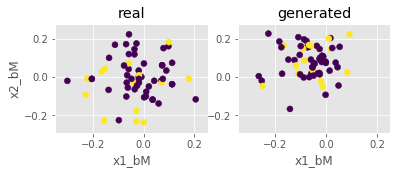

Step: 1600 of 50001.
Losses: G, D Gen, D Real: 0.8910, 0.5449, 0.5694
D Real - D Gen: 0.0245


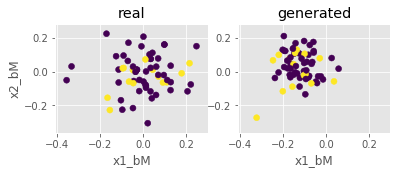

Step: 1700 of 50001.
Losses: G, D Gen, D Real: 0.8682, 0.5816, 0.5219
D Real - D Gen: -0.0597


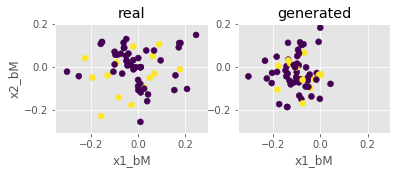

Step: 1800 of 50001.
Losses: G, D Gen, D Real: 0.9689, 0.4890, 0.5519
D Real - D Gen: 0.0629


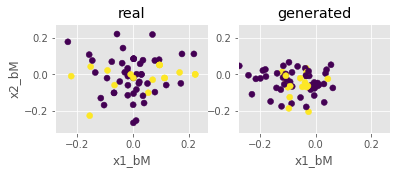

Step: 1900 of 50001.
Losses: G, D Gen, D Real: 1.0380, 0.4588, 0.5388
D Real - D Gen: 0.0799


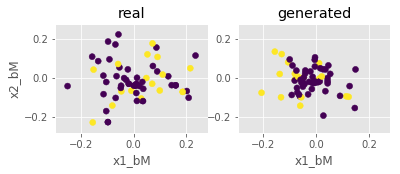

Step: 2000 of 50001.
Losses: G, D Gen, D Real: 0.9787, 0.5456, 0.5538
D Real - D Gen: 0.0083


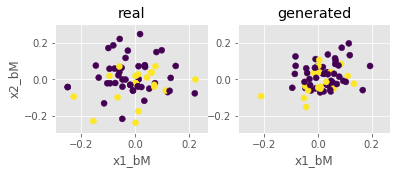

Step: 2100 of 50001.
Losses: G, D Gen, D Real: 0.8198, 0.6093, 0.4864
D Real - D Gen: -0.1229


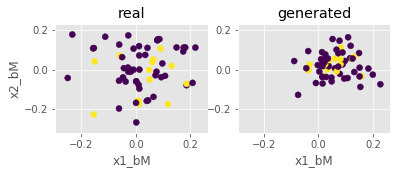

Step: 2200 of 50001.
Losses: G, D Gen, D Real: 0.8130, 0.5835, 0.4806
D Real - D Gen: -0.1029


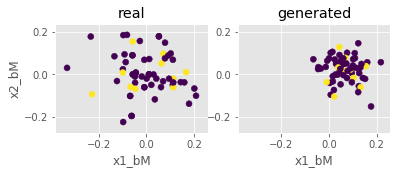

Step: 2300 of 50001.
Losses: G, D Gen, D Real: 0.9850, 0.4738, 0.5707
D Real - D Gen: 0.0969


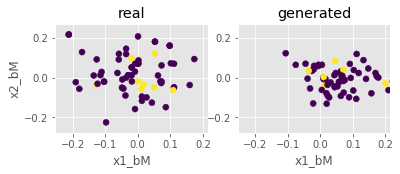

Step: 2400 of 50001.
Losses: G, D Gen, D Real: 0.9369, 0.5445, 0.5442
D Real - D Gen: -0.0003


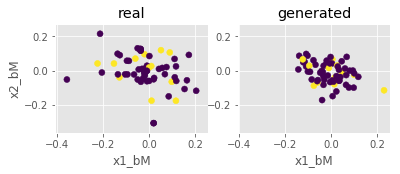

Step: 2500 of 50001.
Losses: G, D Gen, D Real: 0.9514, 0.5195, 0.5736
D Real - D Gen: 0.0541


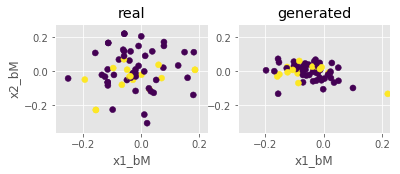

Step: 2600 of 50001.
Losses: G, D Gen, D Real: 1.1224, 0.4323, 0.5183
D Real - D Gen: 0.0861


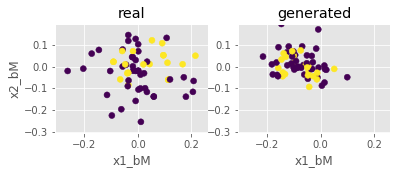

Step: 2700 of 50001.
Losses: G, D Gen, D Real: 1.2265, 0.3667, 0.4074
D Real - D Gen: 0.0406


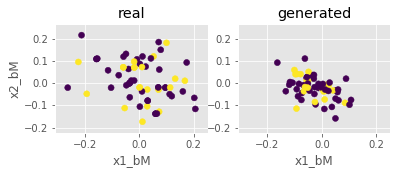

Step: 2800 of 50001.
Losses: G, D Gen, D Real: 1.1432, 0.4373, 0.3811
D Real - D Gen: -0.0562


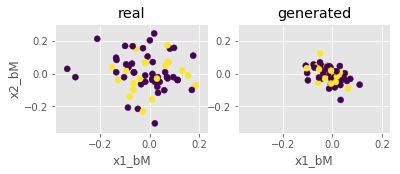

Step: 2900 of 50001.
Losses: G, D Gen, D Real: 0.8773, 0.6903, 0.3858
D Real - D Gen: -0.3044


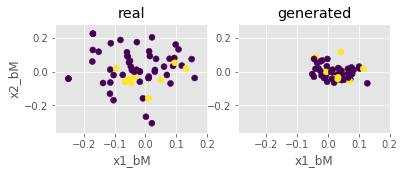

Step: 3000 of 50001.
Losses: G, D Gen, D Real: 0.7869, 0.6417, 0.4228
D Real - D Gen: -0.2189


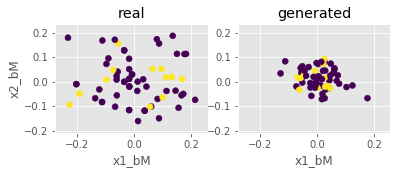

Step: 3100 of 50001.
Losses: G, D Gen, D Real: 0.9542, 0.5574, 0.4538
D Real - D Gen: -0.1036


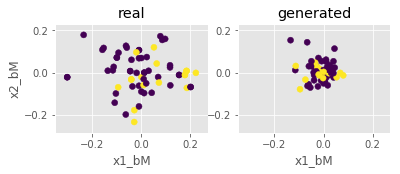

Step: 3200 of 50001.
Losses: G, D Gen, D Real: 1.0391, 0.5165, 0.4491
D Real - D Gen: -0.0673


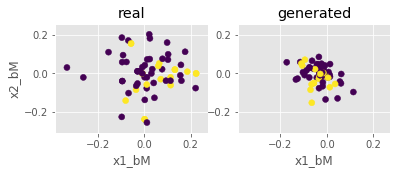

Step: 3300 of 50001.
Losses: G, D Gen, D Real: 1.1029, 0.4772, 0.5345
D Real - D Gen: 0.0573


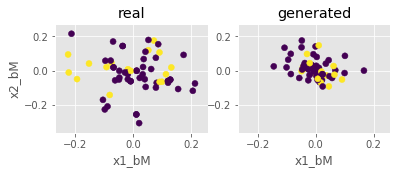

Step: 3400 of 50001.
Losses: G, D Gen, D Real: 1.0984, 0.5295, 0.5196
D Real - D Gen: -0.0099


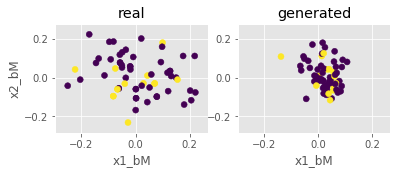

Step: 3500 of 50001.
Losses: G, D Gen, D Real: 1.0155, 0.6164, 0.4162
D Real - D Gen: -0.2002


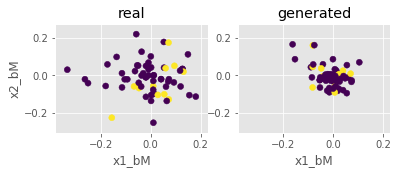

Step: 3600 of 50001.
Losses: G, D Gen, D Real: 0.9240, 0.7965, 0.6572
D Real - D Gen: -0.1393


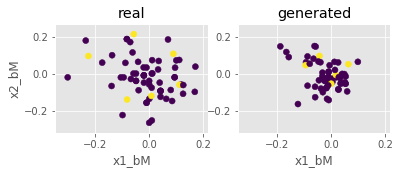

Step: 3700 of 50001.
Losses: G, D Gen, D Real: 0.9092, 0.8185, 0.6611
D Real - D Gen: -0.1575


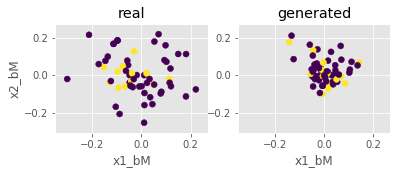

Step: 3800 of 50001.
Losses: G, D Gen, D Real: 0.8334, 0.7272, 0.6280
D Real - D Gen: -0.0993


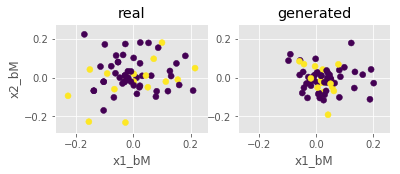

Step: 3900 of 50001.
Losses: G, D Gen, D Real: 0.8562, 0.7718, 0.7472
D Real - D Gen: -0.0246


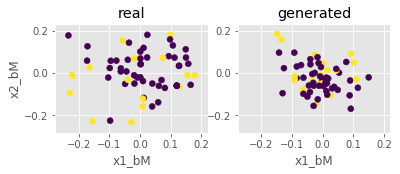

Step: 4000 of 50001.
Losses: G, D Gen, D Real: 0.7646, 0.8181, 0.9102
D Real - D Gen: 0.0921


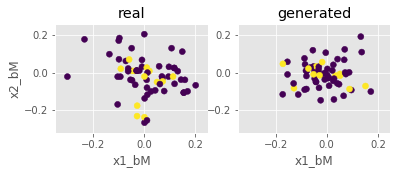

Step: 4100 of 50001.
Losses: G, D Gen, D Real: 0.7873, 0.6523, 0.8554
D Real - D Gen: 0.2031


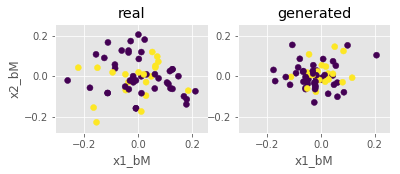

Step: 4200 of 50001.
Losses: G, D Gen, D Real: 0.8573, 0.5866, 0.8820
D Real - D Gen: 0.2955


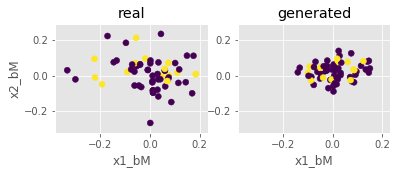

Step: 4300 of 50001.
Losses: G, D Gen, D Real: 0.9214, 0.5536, 0.8306
D Real - D Gen: 0.2770


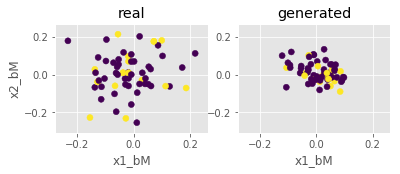

Step: 4400 of 50001.
Losses: G, D Gen, D Real: 0.9152, 0.5569, 0.8352
D Real - D Gen: 0.2783


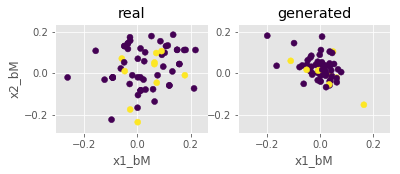

Step: 4500 of 50001.
Losses: G, D Gen, D Real: 0.9215, 0.5587, 0.7992
D Real - D Gen: 0.2406


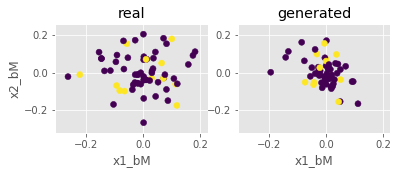

Step: 4600 of 50001.
Losses: G, D Gen, D Real: 0.8826, 0.5393, 0.7633
D Real - D Gen: 0.2240


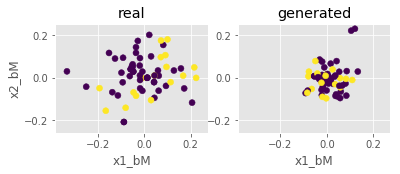

Step: 4700 of 50001.
Losses: G, D Gen, D Real: 0.8417, 0.5650, 0.7750
D Real - D Gen: 0.2100


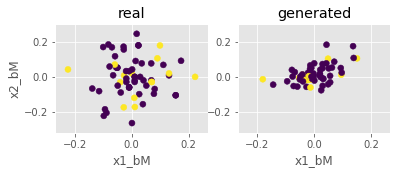

Step: 4800 of 50001.
Losses: G, D Gen, D Real: 0.8195, 0.5571, 0.6461
D Real - D Gen: 0.0890


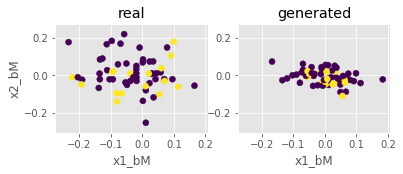

Step: 4900 of 50001.
Losses: G, D Gen, D Real: 0.8490, 0.5953, 0.6513
D Real - D Gen: 0.0559


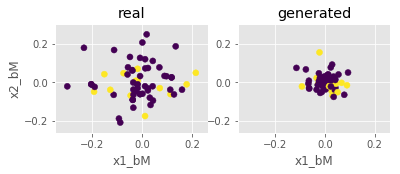

Step: 5000 of 50001.
Losses: G, D Gen, D Real: 0.8042, 0.6528, 0.6010
D Real - D Gen: -0.0518


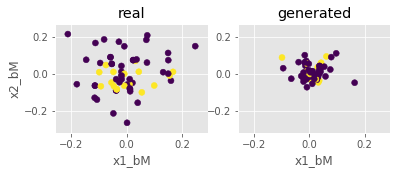

Step: 5100 of 50001.
Losses: G, D Gen, D Real: 0.7517, 0.6722, 0.6038
D Real - D Gen: -0.0683


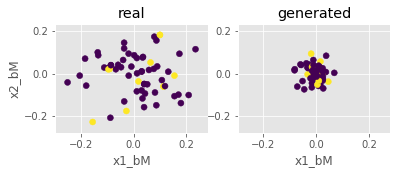

Step: 5200 of 50001.
Losses: G, D Gen, D Real: 0.7313, 0.6358, 0.5979
D Real - D Gen: -0.0379


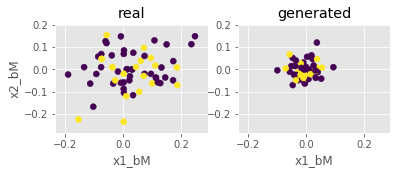

Step: 5300 of 50001.
Losses: G, D Gen, D Real: 0.7507, 0.6382, 0.5537
D Real - D Gen: -0.0845


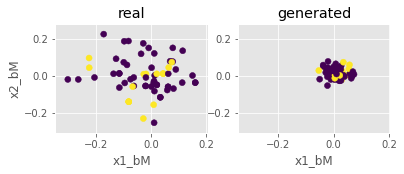

Step: 5400 of 50001.
Losses: G, D Gen, D Real: 0.7804, 0.6319, 0.6022
D Real - D Gen: -0.0297


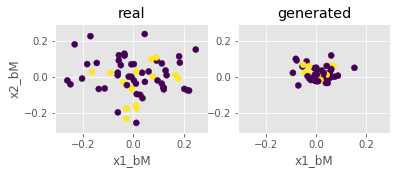

Step: 5500 of 50001.
Losses: G, D Gen, D Real: 0.7894, 0.6599, 0.5770
D Real - D Gen: -0.0829


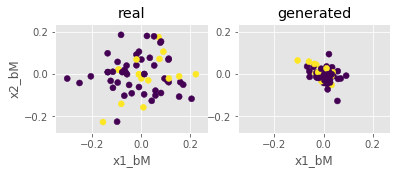

Step: 5600 of 50001.
Losses: G, D Gen, D Real: 0.7541, 0.6391, 0.6122
D Real - D Gen: -0.0268


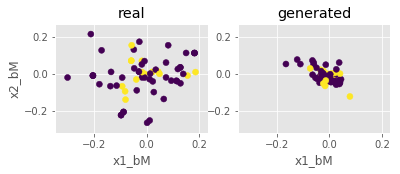

Step: 5700 of 50001.
Losses: G, D Gen, D Real: 0.7876, 0.6200, 0.6253
D Real - D Gen: 0.0054


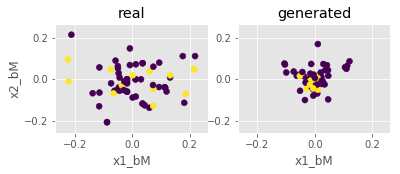

Step: 5800 of 50001.
Losses: G, D Gen, D Real: 0.8200, 0.6050, 0.5995
D Real - D Gen: -0.0055


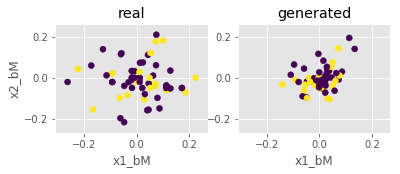

Step: 5900 of 50001.
Losses: G, D Gen, D Real: 0.8458, 0.6195, 0.6370
D Real - D Gen: 0.0175


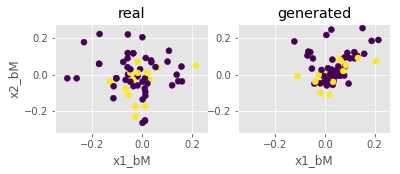

Step: 6000 of 50001.
Losses: G, D Gen, D Real: 0.8068, 0.5760, 0.5990
D Real - D Gen: 0.0230


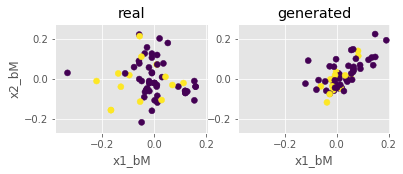

Step: 6100 of 50001.
Losses: G, D Gen, D Real: 0.8159, 0.5662, 0.6135
D Real - D Gen: 0.0473


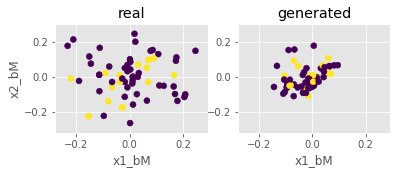

Step: 6200 of 50001.
Losses: G, D Gen, D Real: 0.8437, 0.5637, 0.6416
D Real - D Gen: 0.0778


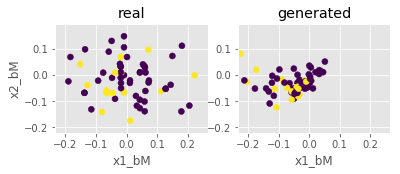

Step: 6300 of 50001.
Losses: G, D Gen, D Real: 0.7908, 0.6117, 0.5559
D Real - D Gen: -0.0559


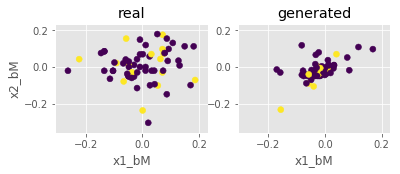

Step: 6400 of 50001.
Losses: G, D Gen, D Real: 0.7939, 0.6438, 0.5899
D Real - D Gen: -0.0538


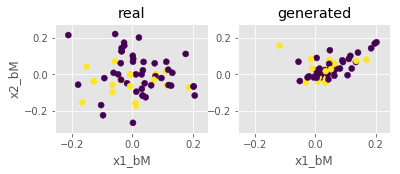

Step: 6500 of 50001.
Losses: G, D Gen, D Real: 0.8216, 0.6001, 0.6426
D Real - D Gen: 0.0425


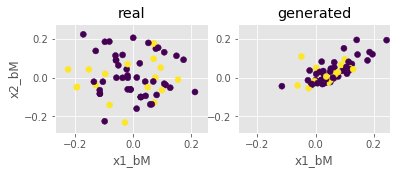

Step: 6600 of 50001.
Losses: G, D Gen, D Real: 0.8344, 0.6461, 0.6478
D Real - D Gen: 0.0017


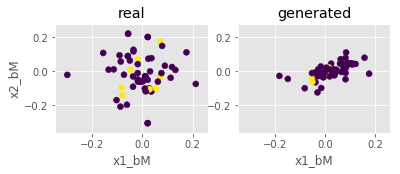

Step: 6700 of 50001.
Losses: G, D Gen, D Real: 0.8411, 0.5882, 0.6325
D Real - D Gen: 0.0442


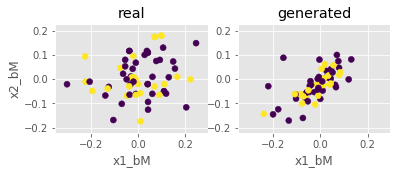

Step: 6800 of 50001.
Losses: G, D Gen, D Real: 0.8312, 0.6126, 0.6103
D Real - D Gen: -0.0023


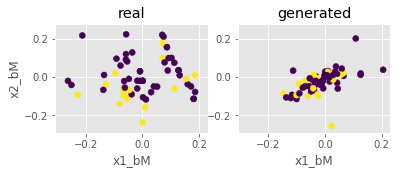

Step: 6900 of 50001.
Losses: G, D Gen, D Real: 0.7821, 0.6514, 0.6233
D Real - D Gen: -0.0281


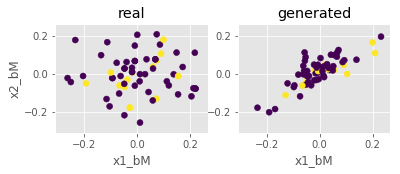

Step: 7000 of 50001.
Losses: G, D Gen, D Real: 0.8738, 0.5958, 0.6760
D Real - D Gen: 0.0803


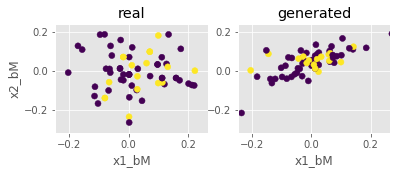

Step: 7100 of 50001.
Losses: G, D Gen, D Real: 0.8476, 0.6303, 0.6068
D Real - D Gen: -0.0235


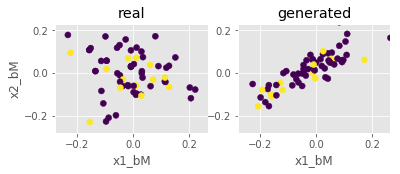

Step: 7200 of 50001.
Losses: G, D Gen, D Real: 0.8186, 0.6080, 0.6637
D Real - D Gen: 0.0557


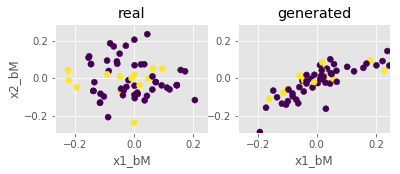

Step: 7300 of 50001.
Losses: G, D Gen, D Real: 0.8602, 0.5589, 0.6468
D Real - D Gen: 0.0878


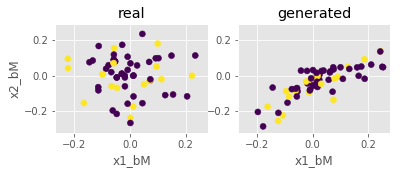

Step: 7400 of 50001.
Losses: G, D Gen, D Real: 0.9331, 0.5300, 0.6327
D Real - D Gen: 0.1026


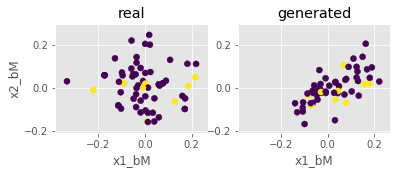

Step: 7500 of 50001.
Losses: G, D Gen, D Real: 0.8600, 0.6046, 0.6045
D Real - D Gen: -0.0001


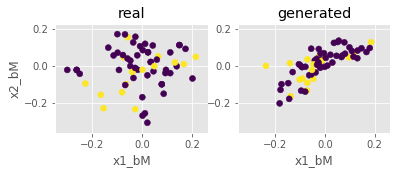

Step: 7600 of 50001.
Losses: G, D Gen, D Real: 0.8800, 0.5341, 0.6093
D Real - D Gen: 0.0752


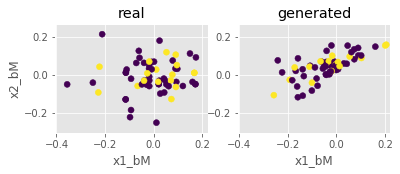

Step: 7700 of 50001.
Losses: G, D Gen, D Real: 0.9939, 0.4462, 0.5747
D Real - D Gen: 0.1285


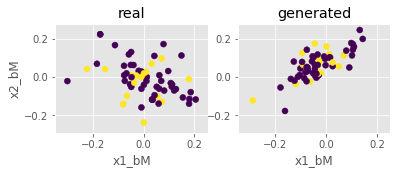

Step: 7800 of 50001.
Losses: G, D Gen, D Real: 0.8725, 0.5545, 0.6011
D Real - D Gen: 0.0466


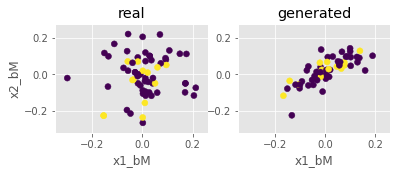

Step: 7900 of 50001.
Losses: G, D Gen, D Real: 0.8265, 0.6539, 0.6503
D Real - D Gen: -0.0036


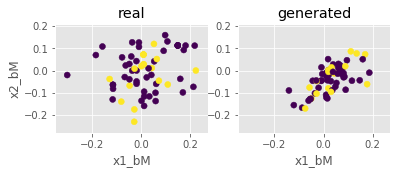

Step: 8000 of 50001.
Losses: G, D Gen, D Real: 0.9058, 0.5340, 0.6605
D Real - D Gen: 0.1265


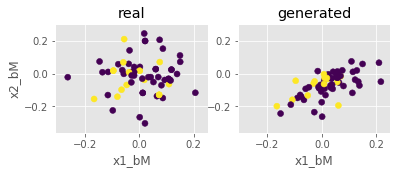

Step: 8100 of 50001.
Losses: G, D Gen, D Real: 1.0144, 0.4477, 0.5907
D Real - D Gen: 0.1430


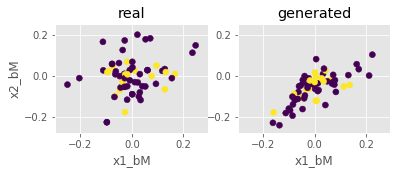

Step: 8200 of 50001.
Losses: G, D Gen, D Real: 0.8382, 0.5873, 0.6175
D Real - D Gen: 0.0302


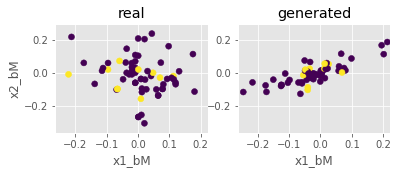

Step: 8300 of 50001.
Losses: G, D Gen, D Real: 0.7535, 0.6965, 0.6233
D Real - D Gen: -0.0732


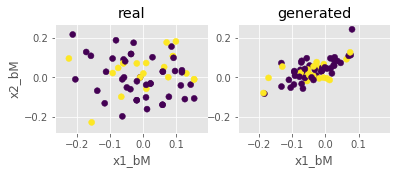

Step: 8400 of 50001.
Losses: G, D Gen, D Real: 0.9301, 0.5431, 0.6127
D Real - D Gen: 0.0696


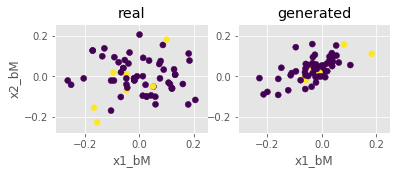

Step: 8500 of 50001.
Losses: G, D Gen, D Real: 1.0868, 0.4805, 0.5265
D Real - D Gen: 0.0460


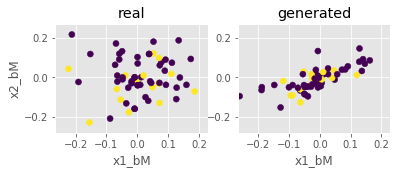

Step: 8600 of 50001.
Losses: G, D Gen, D Real: 0.9094, 0.5617, 0.5493
D Real - D Gen: -0.0124


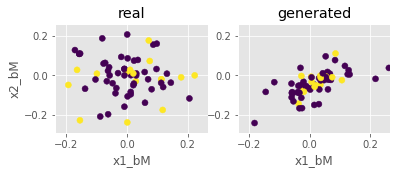

Step: 8700 of 50001.
Losses: G, D Gen, D Real: 0.8693, 0.6273, 0.6132
D Real - D Gen: -0.0141


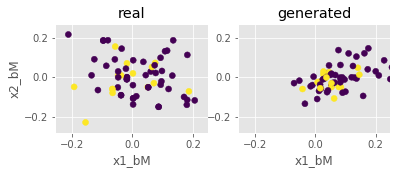

Step: 8800 of 50001.
Losses: G, D Gen, D Real: 0.9160, 0.5522, 0.6538
D Real - D Gen: 0.1015


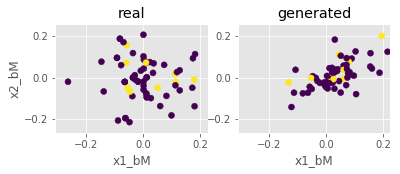

Step: 8900 of 50001.
Losses: G, D Gen, D Real: 1.0198, 0.4507, 0.5667
D Real - D Gen: 0.1159


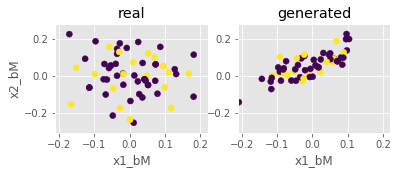

Step: 9000 of 50001.
Losses: G, D Gen, D Real: 0.9431, 0.5117, 0.5128
D Real - D Gen: 0.0011


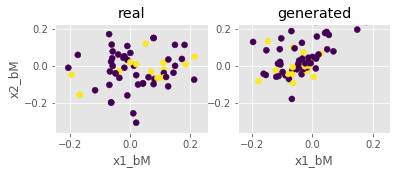

Step: 9100 of 50001.
Losses: G, D Gen, D Real: 0.8348, 0.5989, 0.6083
D Real - D Gen: 0.0094


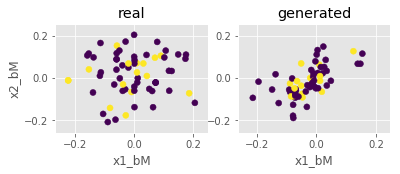

Step: 9200 of 50001.
Losses: G, D Gen, D Real: 0.8502, 0.5763, 0.6142
D Real - D Gen: 0.0379


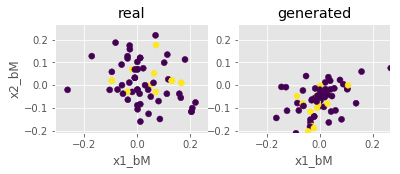

Step: 9300 of 50001.
Losses: G, D Gen, D Real: 1.0494, 0.4674, 0.5867
D Real - D Gen: 0.1193


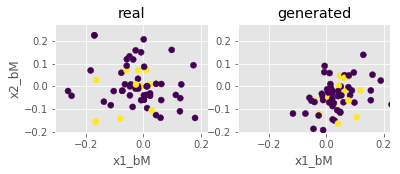

Step: 9400 of 50001.
Losses: G, D Gen, D Real: 0.9564, 0.5017, 0.5873
D Real - D Gen: 0.0856


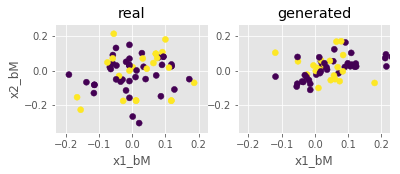

Step: 9500 of 50001.
Losses: G, D Gen, D Real: 0.8829, 0.6333, 0.6454
D Real - D Gen: 0.0121


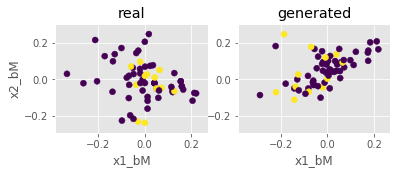

Step: 9600 of 50001.
Losses: G, D Gen, D Real: 0.9565, 0.5123, 0.5486
D Real - D Gen: 0.0364


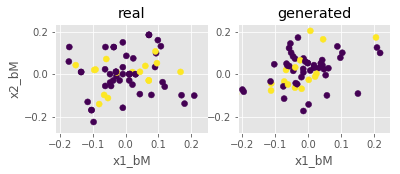

Step: 9700 of 50001.
Losses: G, D Gen, D Real: 0.9849, 0.5198, 0.5236
D Real - D Gen: 0.0038


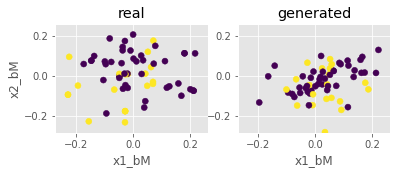

Step: 9800 of 50001.
Losses: G, D Gen, D Real: 0.9098, 0.5406, 0.5677
D Real - D Gen: 0.0271


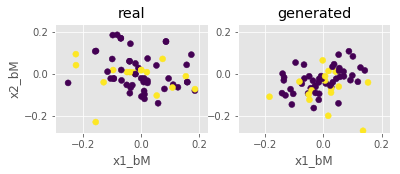

Step: 9900 of 50001.
Losses: G, D Gen, D Real: 0.9255, 0.5510, 0.5514
D Real - D Gen: 0.0004


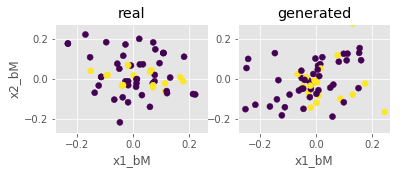

Step: 10000 of 50001.
Losses: G, D Gen, D Real: 0.9660, 0.5869, 0.5949
D Real - D Gen: 0.0080


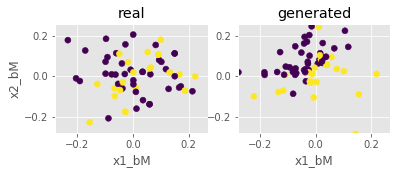

Step: 10100 of 50001.
Losses: G, D Gen, D Real: 0.9580, 0.5187, 0.5542
D Real - D Gen: 0.0355


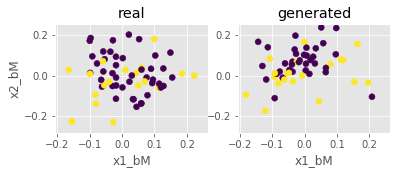

Step: 10200 of 50001.
Losses: G, D Gen, D Real: 0.9177, 0.5346, 0.6031
D Real - D Gen: 0.0685


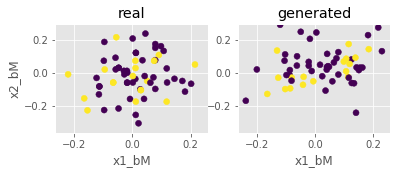

Step: 10300 of 50001.
Losses: G, D Gen, D Real: 0.8662, 0.6157, 0.5732
D Real - D Gen: -0.0425


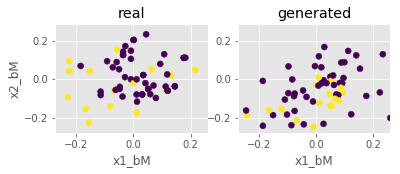

Step: 10400 of 50001.
Losses: G, D Gen, D Real: 0.8825, 0.5848, 0.5796
D Real - D Gen: -0.0052


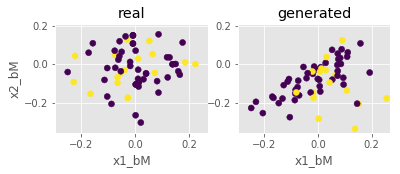

Step: 10500 of 50001.
Losses: G, D Gen, D Real: 1.0414, 0.5475, 0.5635
D Real - D Gen: 0.0160


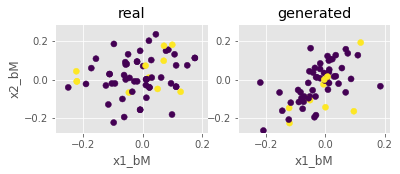

Step: 10600 of 50001.
Losses: G, D Gen, D Real: 0.9623, 0.5393, 0.5440
D Real - D Gen: 0.0047


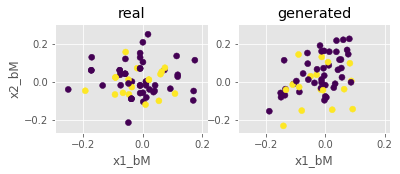

Step: 10700 of 50001.
Losses: G, D Gen, D Real: 0.9578, 0.5711, 0.5960
D Real - D Gen: 0.0248


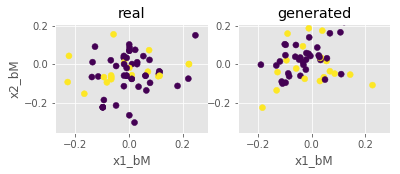

Step: 10800 of 50001.
Losses: G, D Gen, D Real: 0.9822, 0.5034, 0.6326
D Real - D Gen: 0.1292


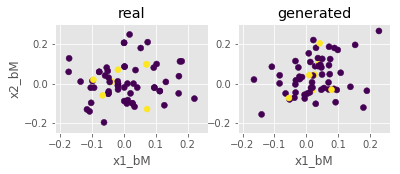

Step: 10900 of 50001.
Losses: G, D Gen, D Real: 0.9327, 0.5575, 0.5645
D Real - D Gen: 0.0069


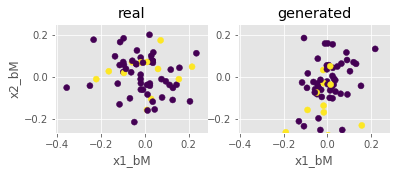

Step: 11000 of 50001.
Losses: G, D Gen, D Real: 0.9178, 0.5506, 0.5794
D Real - D Gen: 0.0288


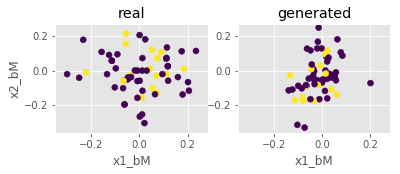

Step: 11100 of 50001.
Losses: G, D Gen, D Real: 0.9465, 0.5015, 0.5706
D Real - D Gen: 0.0691


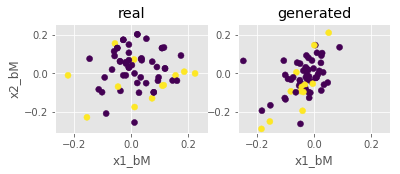

Step: 11200 of 50001.
Losses: G, D Gen, D Real: 0.9772, 0.5111, 0.6227
D Real - D Gen: 0.1116


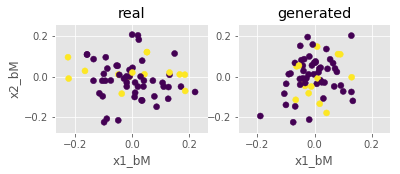

Step: 11300 of 50001.
Losses: G, D Gen, D Real: 1.0342, 0.5437, 0.5352
D Real - D Gen: -0.0086


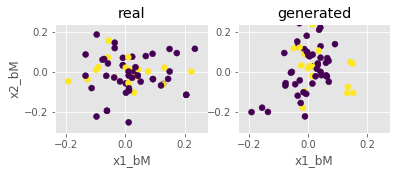

Step: 11400 of 50001.
Losses: G, D Gen, D Real: 1.0256, 0.5112, 0.5536
D Real - D Gen: 0.0423


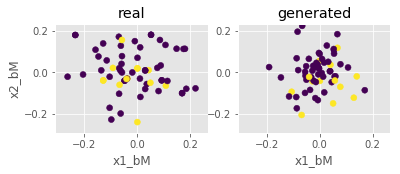

Step: 11500 of 50001.
Losses: G, D Gen, D Real: 0.9433, 0.5511, 0.5581
D Real - D Gen: 0.0070


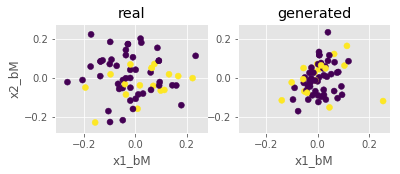

Step: 11600 of 50001.
Losses: G, D Gen, D Real: 0.9729, 0.5252, 0.5669
D Real - D Gen: 0.0417


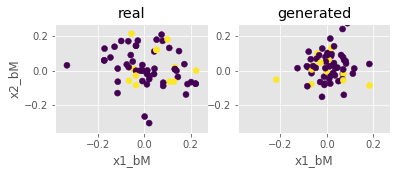

Step: 11700 of 50001.
Losses: G, D Gen, D Real: 0.9288, 0.5561, 0.5691
D Real - D Gen: 0.0129


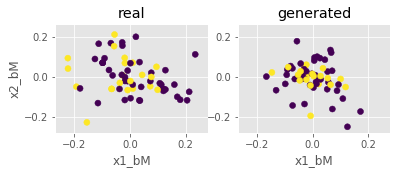

Step: 11800 of 50001.
Losses: G, D Gen, D Real: 0.9549, 0.4984, 0.5954
D Real - D Gen: 0.0970


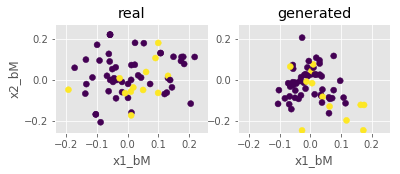

Step: 11900 of 50001.
Losses: G, D Gen, D Real: 0.9398, 0.5415, 0.6051
D Real - D Gen: 0.0636


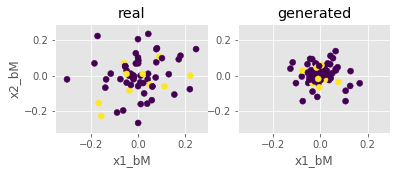

Step: 12000 of 50001.
Losses: G, D Gen, D Real: 0.9820, 0.5385, 0.5839
D Real - D Gen: 0.0455


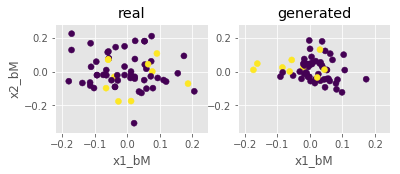

Step: 12100 of 50001.
Losses: G, D Gen, D Real: 0.9169, 0.5137, 0.5745
D Real - D Gen: 0.0609


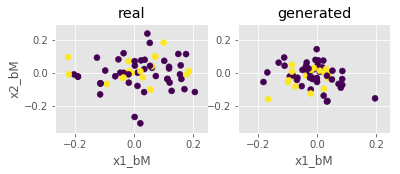

Step: 12200 of 50001.
Losses: G, D Gen, D Real: 0.9683, 0.5321, 0.5597
D Real - D Gen: 0.0276


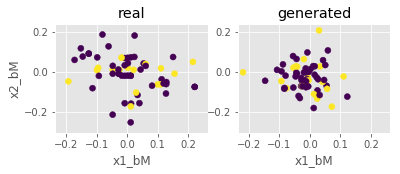

Step: 12300 of 50001.
Losses: G, D Gen, D Real: 1.0289, 0.4672, 0.5417
D Real - D Gen: 0.0745


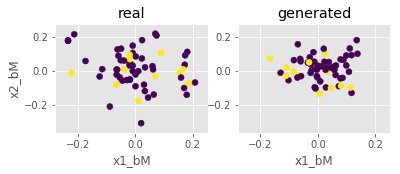

Step: 12400 of 50001.
Losses: G, D Gen, D Real: 0.8967, 0.5384, 0.6183
D Real - D Gen: 0.0799


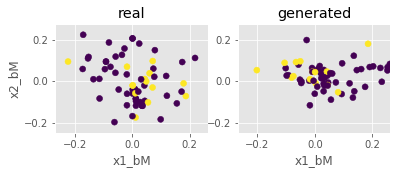

Step: 12500 of 50001.
Losses: G, D Gen, D Real: 0.9938, 0.5073, 0.5474
D Real - D Gen: 0.0401


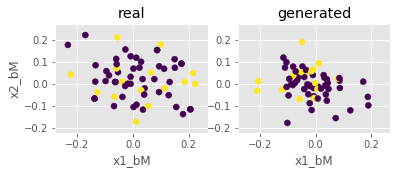

Step: 12600 of 50001.
Losses: G, D Gen, D Real: 1.0135, 0.5416, 0.5519
D Real - D Gen: 0.0103


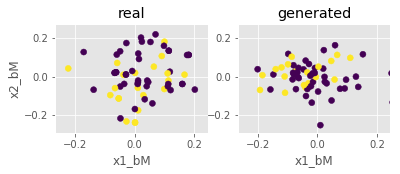

Step: 12700 of 50001.
Losses: G, D Gen, D Real: 0.9966, 0.5077, 0.4799
D Real - D Gen: -0.0277


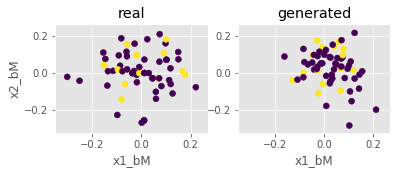

Step: 12800 of 50001.
Losses: G, D Gen, D Real: 1.0482, 0.4758, 0.5541
D Real - D Gen: 0.0782


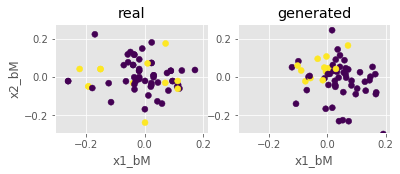

Step: 12900 of 50001.
Losses: G, D Gen, D Real: 0.9821, 0.5410, 0.5283
D Real - D Gen: -0.0127


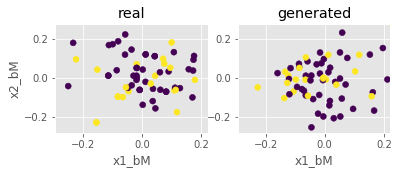

Step: 13000 of 50001.
Losses: G, D Gen, D Real: 1.0284, 0.4979, 0.5050
D Real - D Gen: 0.0071


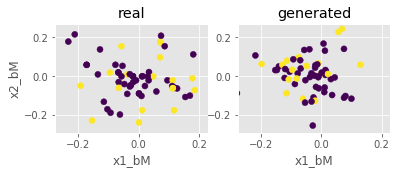

Step: 13100 of 50001.
Losses: G, D Gen, D Real: 0.9928, 0.4675, 0.5351
D Real - D Gen: 0.0677


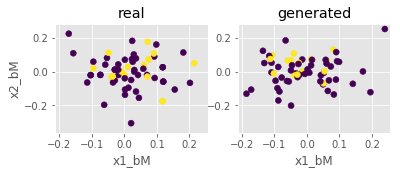

Step: 13200 of 50001.
Losses: G, D Gen, D Real: 0.9736, 0.4930, 0.5529
D Real - D Gen: 0.0599


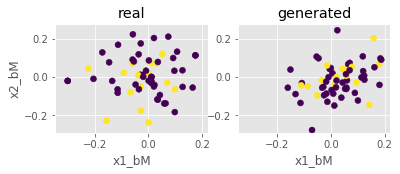

Step: 13300 of 50001.
Losses: G, D Gen, D Real: 0.9610, 0.5454, 0.5619
D Real - D Gen: 0.0165


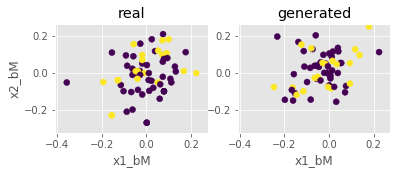

Step: 13400 of 50001.
Losses: G, D Gen, D Real: 0.9238, 0.4968, 0.5621
D Real - D Gen: 0.0653


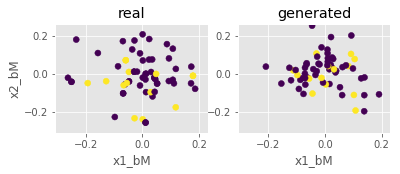

Step: 13500 of 50001.
Losses: G, D Gen, D Real: 0.9753, 0.5050, 0.5335
D Real - D Gen: 0.0286


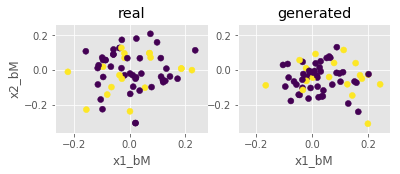

Step: 13600 of 50001.
Losses: G, D Gen, D Real: 1.0322, 0.5116, 0.5393
D Real - D Gen: 0.0277


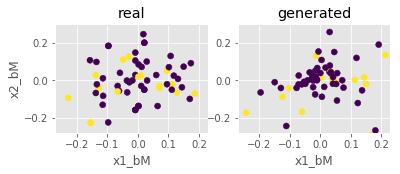

Step: 13700 of 50001.
Losses: G, D Gen, D Real: 0.9917, 0.5154, 0.5300
D Real - D Gen: 0.0146


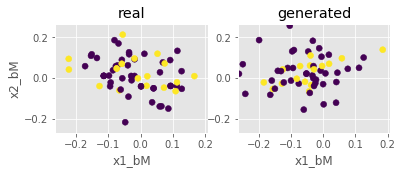

Step: 13800 of 50001.
Losses: G, D Gen, D Real: 1.0554, 0.4851, 0.4930
D Real - D Gen: 0.0079


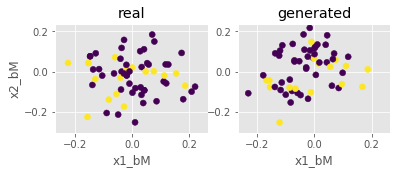

Step: 13900 of 50001.
Losses: G, D Gen, D Real: 0.9690, 0.5563, 0.5338
D Real - D Gen: -0.0224


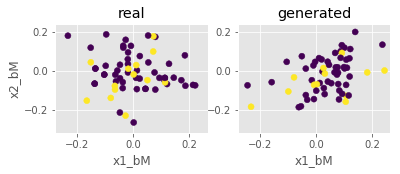

Step: 14000 of 50001.
Losses: G, D Gen, D Real: 1.0816, 0.4587, 0.5188
D Real - D Gen: 0.0601


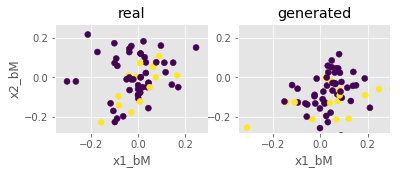

Step: 14100 of 50001.
Losses: G, D Gen, D Real: 1.0885, 0.5342, 0.4550
D Real - D Gen: -0.0792


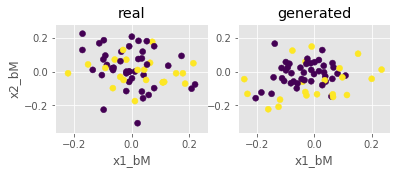

Step: 14200 of 50001.
Losses: G, D Gen, D Real: 1.0599, 0.5012, 0.4842
D Real - D Gen: -0.0171


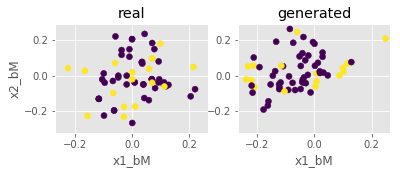

Step: 14300 of 50001.
Losses: G, D Gen, D Real: 1.1445, 0.4671, 0.5332
D Real - D Gen: 0.0661


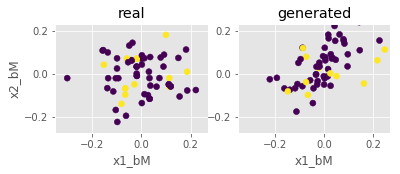

Step: 14400 of 50001.
Losses: G, D Gen, D Real: 0.9832, 0.5124, 0.5575
D Real - D Gen: 0.0451


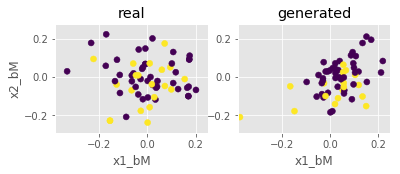

Step: 14500 of 50001.
Losses: G, D Gen, D Real: 0.9862, 0.5737, 0.5787
D Real - D Gen: 0.0050


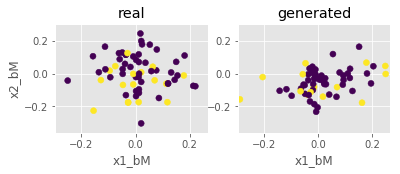

Step: 14600 of 50001.
Losses: G, D Gen, D Real: 0.9722, 0.5005, 0.5060
D Real - D Gen: 0.0055


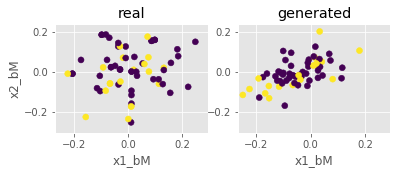

Step: 14700 of 50001.
Losses: G, D Gen, D Real: 1.1035, 0.4673, 0.4858
D Real - D Gen: 0.0185


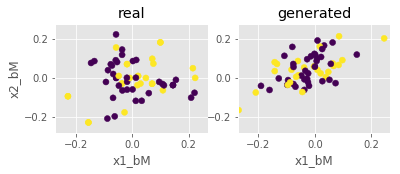

Step: 14800 of 50001.
Losses: G, D Gen, D Real: 1.0469, 0.5544, 0.5304
D Real - D Gen: -0.0240


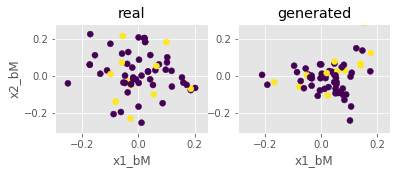

Step: 14900 of 50001.
Losses: G, D Gen, D Real: 1.0324, 0.4418, 0.5048
D Real - D Gen: 0.0630


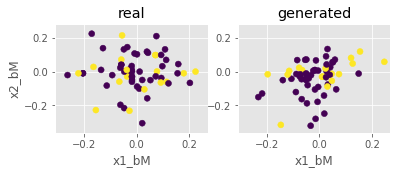

Step: 15000 of 50001.
Losses: G, D Gen, D Real: 1.0467, 0.4513, 0.4911
D Real - D Gen: 0.0398


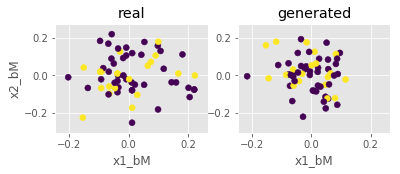

Step: 15100 of 50001.
Losses: G, D Gen, D Real: 0.9768, 0.5124, 0.4908
D Real - D Gen: -0.0215


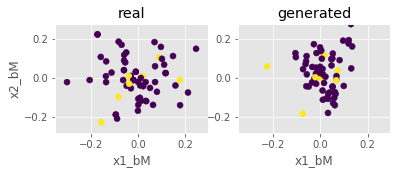

Step: 15200 of 50001.
Losses: G, D Gen, D Real: 1.0846, 0.4563, 0.4921
D Real - D Gen: 0.0357


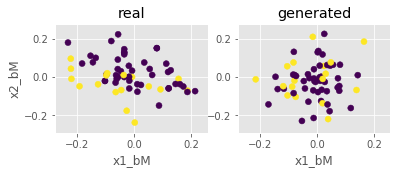

Step: 15300 of 50001.
Losses: G, D Gen, D Real: 1.0256, 0.4809, 0.5358
D Real - D Gen: 0.0548


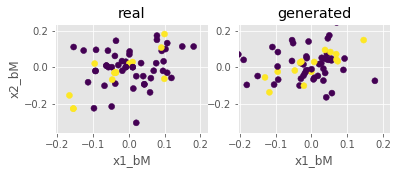

Step: 15400 of 50001.
Losses: G, D Gen, D Real: 1.1115, 0.4138, 0.5206
D Real - D Gen: 0.1068


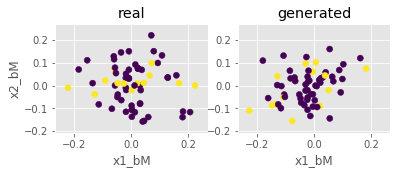

Step: 15500 of 50001.
Losses: G, D Gen, D Real: 0.9103, 0.4930, 0.5245
D Real - D Gen: 0.0314


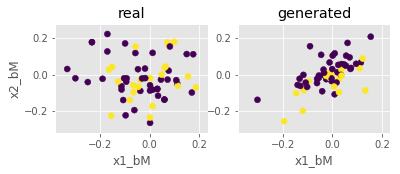

Step: 15600 of 50001.
Losses: G, D Gen, D Real: 1.1044, 0.5007, 0.5050
D Real - D Gen: 0.0042


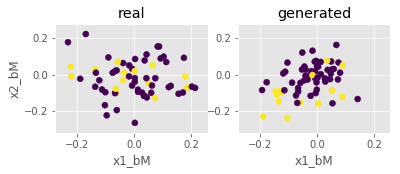

Step: 15700 of 50001.
Losses: G, D Gen, D Real: 1.0966, 0.5393, 0.4596
D Real - D Gen: -0.0797


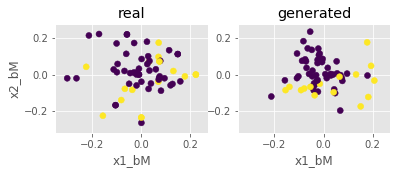

Step: 15800 of 50001.
Losses: G, D Gen, D Real: 1.1280, 0.4449, 0.4456
D Real - D Gen: 0.0007


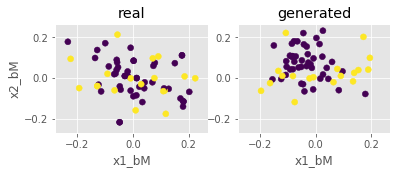

Step: 15900 of 50001.
Losses: G, D Gen, D Real: 1.0629, 0.4416, 0.5359
D Real - D Gen: 0.0942


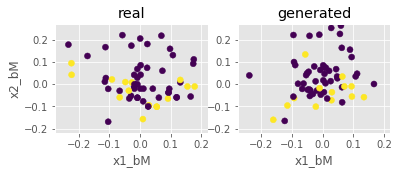

Step: 16000 of 50001.
Losses: G, D Gen, D Real: 1.1163, 0.5276, 0.5713
D Real - D Gen: 0.0437


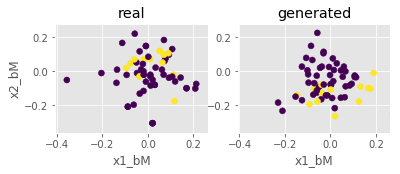

Step: 16100 of 50001.
Losses: G, D Gen, D Real: 1.1562, 0.4702, 0.5645
D Real - D Gen: 0.0943


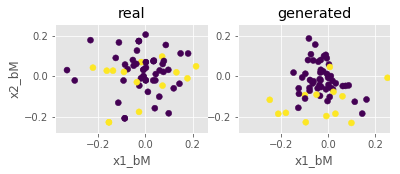

Step: 16200 of 50001.
Losses: G, D Gen, D Real: 1.0834, 0.4683, 0.4892
D Real - D Gen: 0.0209


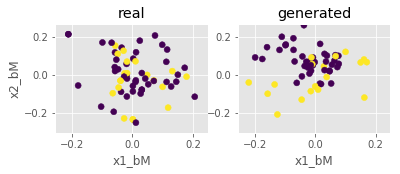

Step: 16300 of 50001.
Losses: G, D Gen, D Real: 1.0887, 0.4871, 0.5411
D Real - D Gen: 0.0541


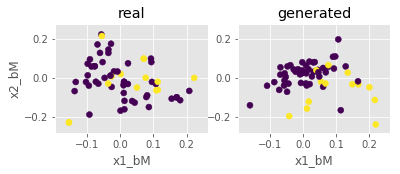

Step: 16400 of 50001.
Losses: G, D Gen, D Real: 1.0990, 0.4617, 0.4800
D Real - D Gen: 0.0183


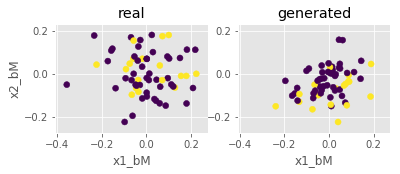

Step: 16500 of 50001.
Losses: G, D Gen, D Real: 1.1435, 0.4518, 0.4763
D Real - D Gen: 0.0245


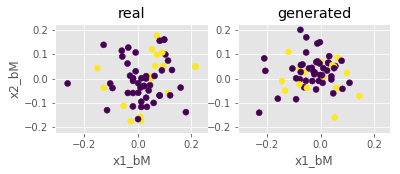

Step: 16600 of 50001.
Losses: G, D Gen, D Real: 1.1640, 0.4634, 0.5148
D Real - D Gen: 0.0514


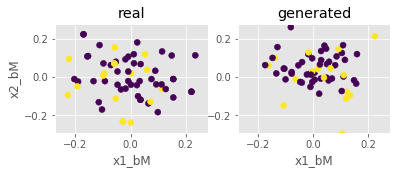

Step: 16700 of 50001.
Losses: G, D Gen, D Real: 1.1105, 0.4691, 0.4739
D Real - D Gen: 0.0048


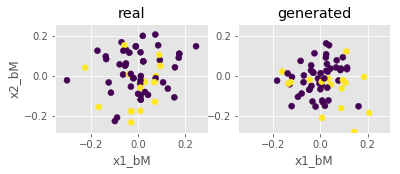

Step: 16800 of 50001.
Losses: G, D Gen, D Real: 1.1392, 0.4827, 0.4979
D Real - D Gen: 0.0152


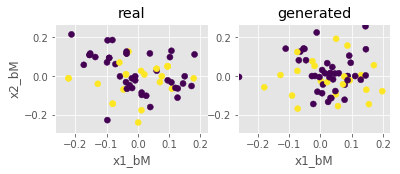

Step: 16900 of 50001.
Losses: G, D Gen, D Real: 1.1010, 0.5084, 0.4446
D Real - D Gen: -0.0638


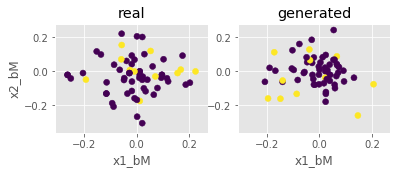

Step: 17000 of 50001.
Losses: G, D Gen, D Real: 1.1061, 0.4614, 0.5092
D Real - D Gen: 0.0478


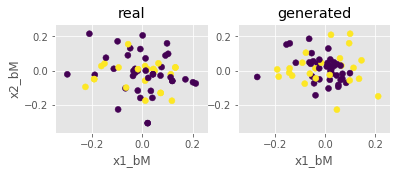

Step: 17100 of 50001.
Losses: G, D Gen, D Real: 1.1543, 0.4747, 0.5078
D Real - D Gen: 0.0331


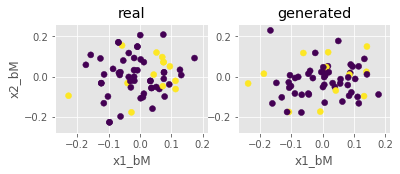

Step: 17200 of 50001.
Losses: G, D Gen, D Real: 1.1421, 0.4061, 0.5390
D Real - D Gen: 0.1329


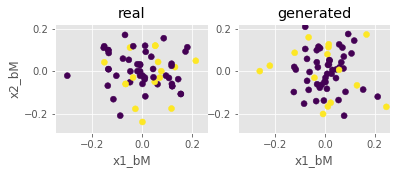

Step: 17300 of 50001.
Losses: G, D Gen, D Real: 1.1962, 0.4105, 0.4382
D Real - D Gen: 0.0277


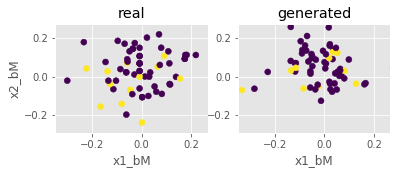

Step: 17400 of 50001.
Losses: G, D Gen, D Real: 1.1575, 0.4251, 0.4618
D Real - D Gen: 0.0367


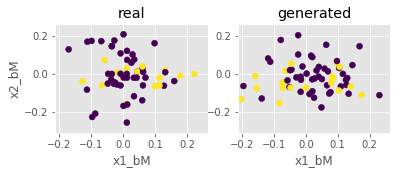

Step: 17500 of 50001.
Losses: G, D Gen, D Real: 1.1971, 0.4673, 0.5010
D Real - D Gen: 0.0337


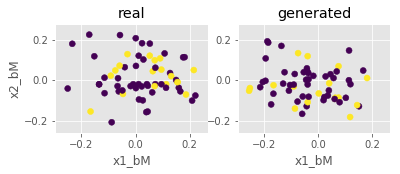

Step: 17600 of 50001.
Losses: G, D Gen, D Real: 1.1046, 0.4291, 0.5258
D Real - D Gen: 0.0967


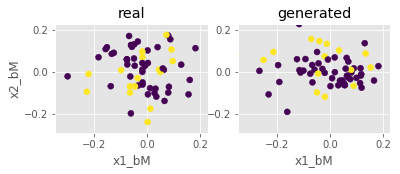

Step: 17700 of 50001.
Losses: G, D Gen, D Real: 1.2034, 0.4536, 0.4307
D Real - D Gen: -0.0230


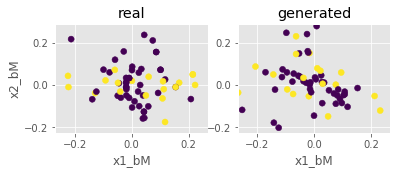

Step: 17800 of 50001.
Losses: G, D Gen, D Real: 1.1309, 0.4717, 0.5477
D Real - D Gen: 0.0760


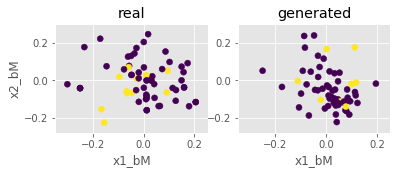

Step: 17900 of 50001.
Losses: G, D Gen, D Real: 1.0126, 0.4837, 0.5089
D Real - D Gen: 0.0253


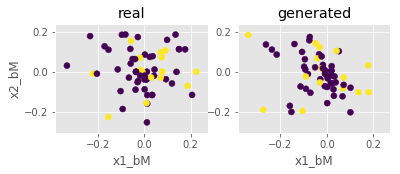

Step: 18000 of 50001.
Losses: G, D Gen, D Real: 1.2041, 0.4806, 0.5366
D Real - D Gen: 0.0560


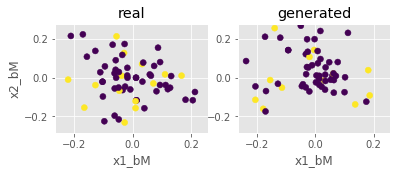

Step: 18100 of 50001.
Losses: G, D Gen, D Real: 1.0641, 0.4986, 0.5147
D Real - D Gen: 0.0161


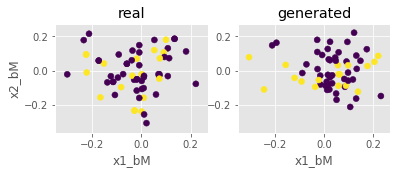

Step: 18200 of 50001.
Losses: G, D Gen, D Real: 1.1335, 0.4548, 0.3949
D Real - D Gen: -0.0599


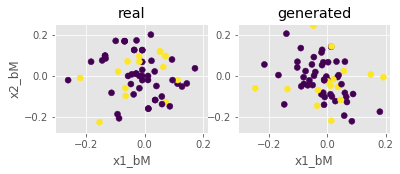

Step: 18300 of 50001.
Losses: G, D Gen, D Real: 1.1736, 0.4449, 0.4647
D Real - D Gen: 0.0198


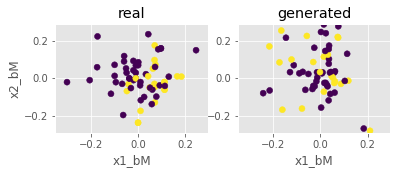

Step: 18400 of 50001.
Losses: G, D Gen, D Real: 1.1543, 0.4836, 0.4310
D Real - D Gen: -0.0526


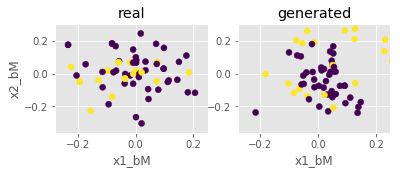

Step: 18500 of 50001.
Losses: G, D Gen, D Real: 1.1646, 0.4597, 0.4908
D Real - D Gen: 0.0310


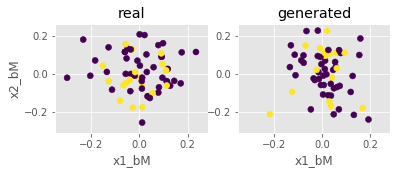

Step: 18600 of 50001.
Losses: G, D Gen, D Real: 1.1707, 0.4039, 0.4291
D Real - D Gen: 0.0252


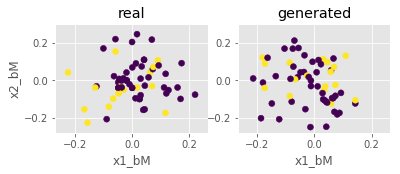

Step: 18700 of 50001.
Losses: G, D Gen, D Real: 1.2284, 0.4710, 0.5281
D Real - D Gen: 0.0571


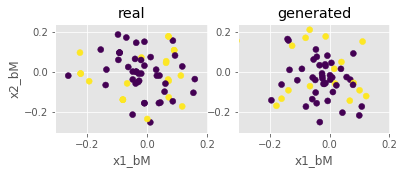

Step: 18800 of 50001.
Losses: G, D Gen, D Real: 1.2590, 0.4582, 0.5012
D Real - D Gen: 0.0429


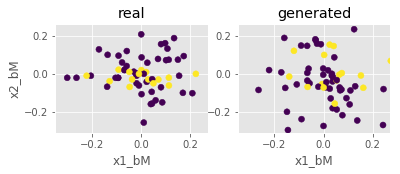

Step: 18900 of 50001.
Losses: G, D Gen, D Real: 1.1736, 0.4330, 0.4756
D Real - D Gen: 0.0426


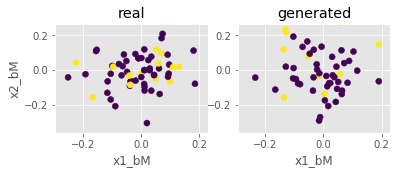

Step: 19000 of 50001.
Losses: G, D Gen, D Real: 1.1461, 0.4338, 0.4167
D Real - D Gen: -0.0171


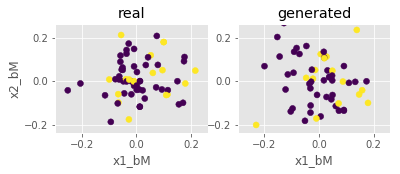

Step: 19100 of 50001.
Losses: G, D Gen, D Real: 1.2668, 0.4722, 0.5369
D Real - D Gen: 0.0647


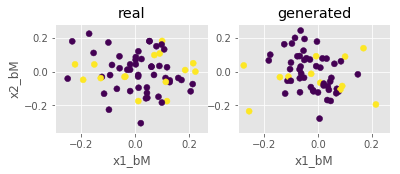

Step: 19200 of 50001.
Losses: G, D Gen, D Real: 1.1358, 0.4359, 0.4618
D Real - D Gen: 0.0258


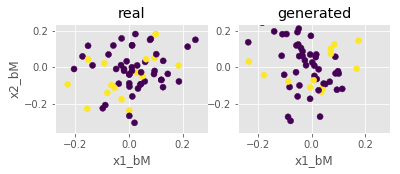

Step: 19300 of 50001.
Losses: G, D Gen, D Real: 1.2576, 0.3701, 0.4727
D Real - D Gen: 0.1027


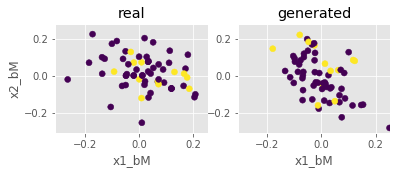

Step: 19400 of 50001.
Losses: G, D Gen, D Real: 1.1678, 0.4286, 0.4428
D Real - D Gen: 0.0142


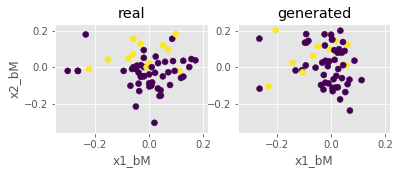

Step: 19500 of 50001.
Losses: G, D Gen, D Real: 1.2474, 0.3982, 0.4716
D Real - D Gen: 0.0734


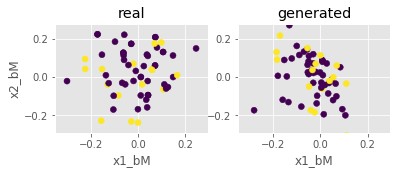

Step: 19600 of 50001.
Losses: G, D Gen, D Real: 1.1588, 0.4362, 0.5160
D Real - D Gen: 0.0797


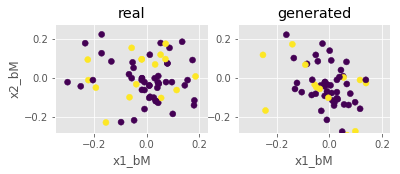

Step: 19700 of 50001.
Losses: G, D Gen, D Real: 1.2477, 0.4177, 0.4037
D Real - D Gen: -0.0140


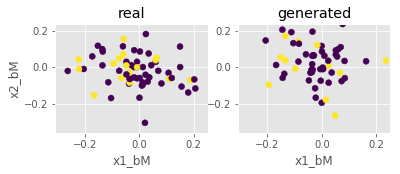

Step: 19800 of 50001.
Losses: G, D Gen, D Real: 1.2854, 0.4498, 0.4742
D Real - D Gen: 0.0244


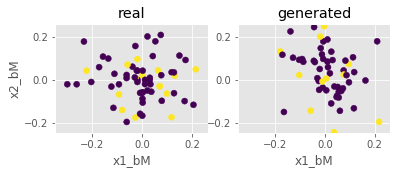

Step: 19900 of 50001.
Losses: G, D Gen, D Real: 1.1512, 0.3823, 0.3861
D Real - D Gen: 0.0038


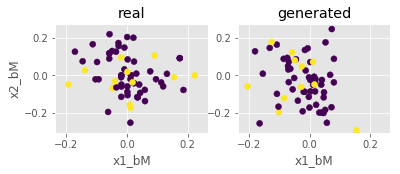

Step: 20000 of 50001.
Losses: G, D Gen, D Real: 1.2189, 0.4753, 0.4485
D Real - D Gen: -0.0268


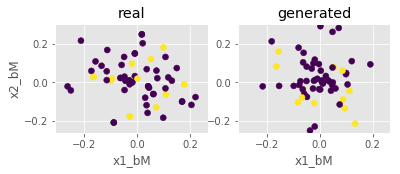

Step: 20100 of 50001.
Losses: G, D Gen, D Real: 1.2364, 0.4263, 0.3756
D Real - D Gen: -0.0508


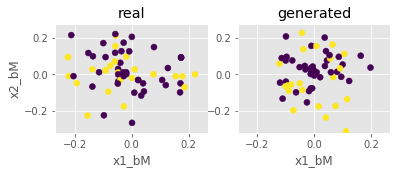

Step: 20200 of 50001.
Losses: G, D Gen, D Real: 1.2339, 0.4406, 0.3425
D Real - D Gen: -0.0981


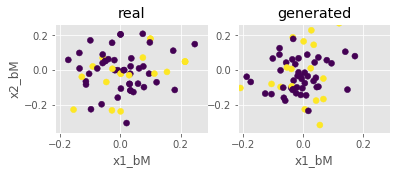

Step: 20300 of 50001.
Losses: G, D Gen, D Real: 1.2698, 0.4451, 0.4345
D Real - D Gen: -0.0106


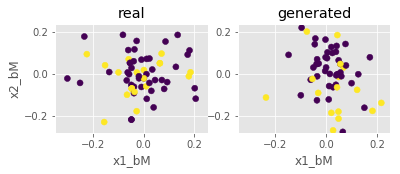

Step: 20400 of 50001.
Losses: G, D Gen, D Real: 1.2250, 0.4126, 0.4721
D Real - D Gen: 0.0596


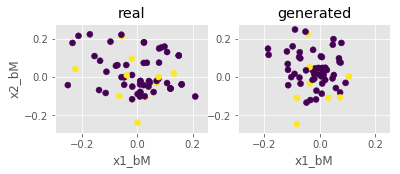

Step: 20500 of 50001.
Losses: G, D Gen, D Real: 1.2611, 0.4886, 0.5288
D Real - D Gen: 0.0402


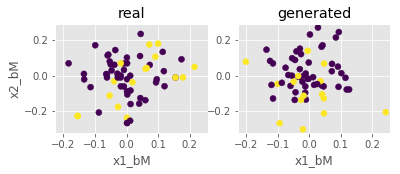

Step: 20600 of 50001.
Losses: G, D Gen, D Real: 1.2582, 0.4435, 0.5087
D Real - D Gen: 0.0651


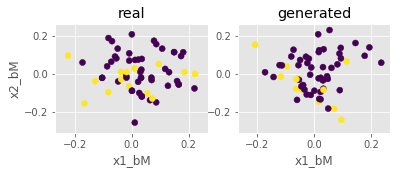

Step: 20700 of 50001.
Losses: G, D Gen, D Real: 1.1773, 0.4494, 0.4313
D Real - D Gen: -0.0180


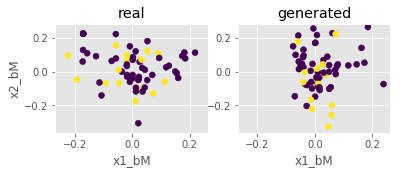

Step: 20800 of 50001.
Losses: G, D Gen, D Real: 1.2724, 0.4117, 0.3645
D Real - D Gen: -0.0472


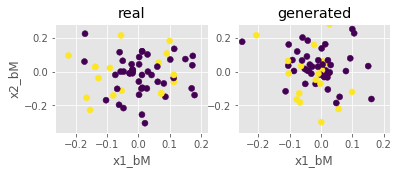

Step: 20900 of 50001.
Losses: G, D Gen, D Real: 1.2821, 0.3932, 0.4138
D Real - D Gen: 0.0207


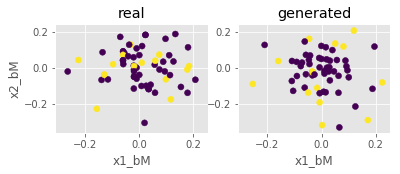

Step: 21000 of 50001.
Losses: G, D Gen, D Real: 1.2573, 0.4108, 0.4903
D Real - D Gen: 0.0795


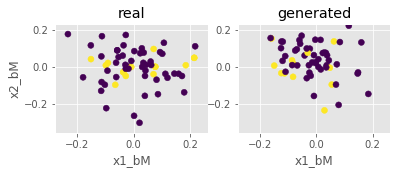

Step: 21100 of 50001.
Losses: G, D Gen, D Real: 1.1355, 0.4054, 0.3823
D Real - D Gen: -0.0231


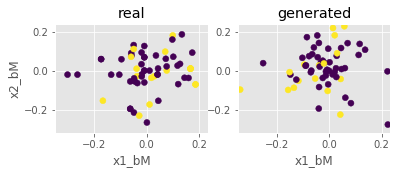

Step: 21200 of 50001.
Losses: G, D Gen, D Real: 1.2071, 0.4454, 0.4624
D Real - D Gen: 0.0170


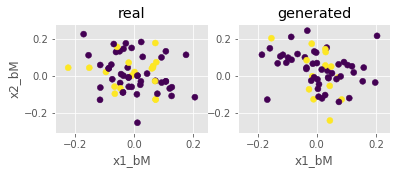

Step: 21300 of 50001.
Losses: G, D Gen, D Real: 1.1632, 0.4287, 0.4454
D Real - D Gen: 0.0166


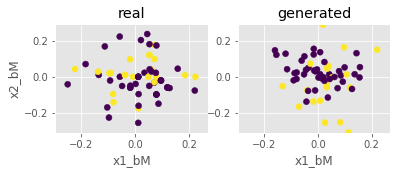

Step: 21400 of 50001.
Losses: G, D Gen, D Real: 1.2148, 0.4416, 0.4440
D Real - D Gen: 0.0024


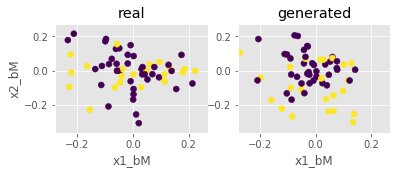

Step: 21500 of 50001.
Losses: G, D Gen, D Real: 1.3124, 0.4748, 0.4032
D Real - D Gen: -0.0717


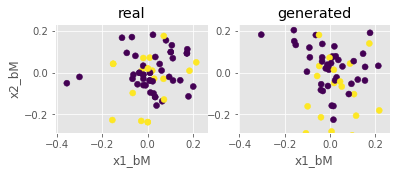

Step: 21600 of 50001.
Losses: G, D Gen, D Real: 1.2820, 0.3854, 0.4023
D Real - D Gen: 0.0170


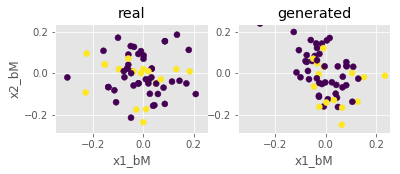

Step: 21700 of 50001.
Losses: G, D Gen, D Real: 1.4277, 0.3431, 0.3403
D Real - D Gen: -0.0028


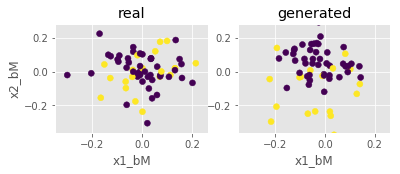

Step: 21800 of 50001.
Losses: G, D Gen, D Real: 1.3888, 0.3480, 0.3808
D Real - D Gen: 0.0328


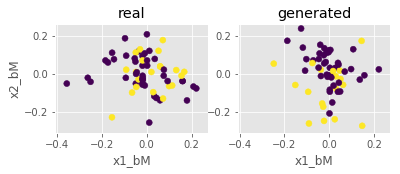

Step: 21900 of 50001.
Losses: G, D Gen, D Real: 1.3921, 0.3484, 0.4065
D Real - D Gen: 0.0581


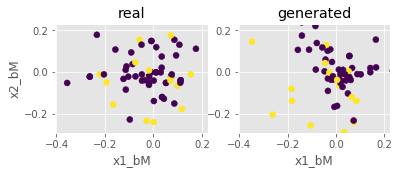

Step: 22000 of 50001.
Losses: G, D Gen, D Real: 1.4111, 0.3872, 0.3797
D Real - D Gen: -0.0075


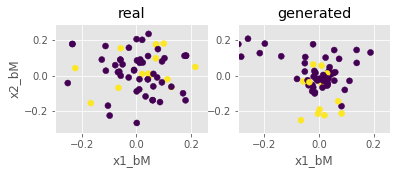

Step: 22100 of 50001.
Losses: G, D Gen, D Real: 1.3383, 0.3674, 0.3803
D Real - D Gen: 0.0129


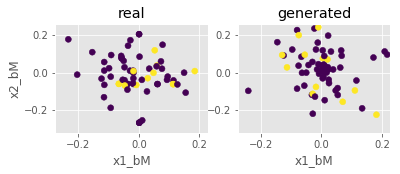

Step: 22200 of 50001.
Losses: G, D Gen, D Real: 1.2487, 0.3624, 0.4067
D Real - D Gen: 0.0443


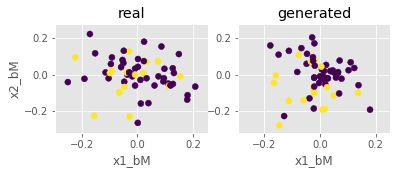

Step: 22300 of 50001.
Losses: G, D Gen, D Real: 1.3175, 0.5120, 0.4593
D Real - D Gen: -0.0527


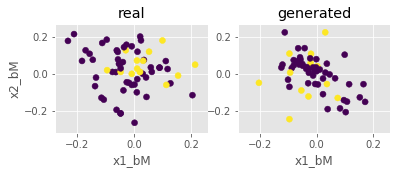

Step: 22400 of 50001.
Losses: G, D Gen, D Real: 1.3324, 0.4024, 0.4528
D Real - D Gen: 0.0504


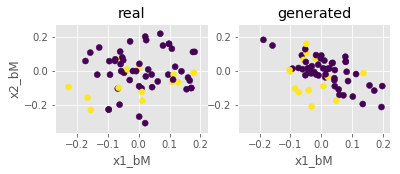

Step: 22500 of 50001.
Losses: G, D Gen, D Real: 1.2537, 0.3939, 0.4716
D Real - D Gen: 0.0777


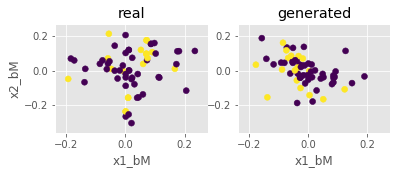

Step: 22600 of 50001.
Losses: G, D Gen, D Real: 1.3276, 0.3622, 0.4635
D Real - D Gen: 0.1013


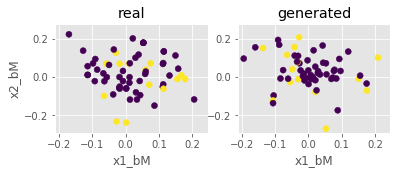

Step: 22700 of 50001.
Losses: G, D Gen, D Real: 1.3369, 0.4022, 0.4437
D Real - D Gen: 0.0415


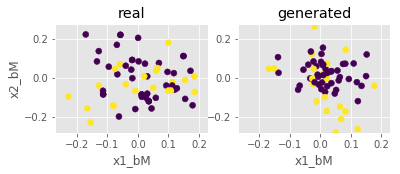

Step: 22800 of 50001.
Losses: G, D Gen, D Real: 1.4121, 0.4253, 0.4697
D Real - D Gen: 0.0444


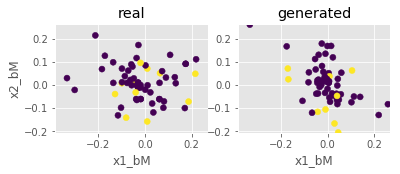

Step: 22900 of 50001.
Losses: G, D Gen, D Real: 1.4338, 0.3758, 0.3599
D Real - D Gen: -0.0158


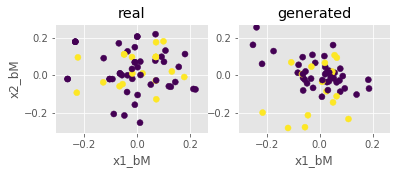

Step: 23000 of 50001.
Losses: G, D Gen, D Real: 1.1833, 0.4316, 0.4509
D Real - D Gen: 0.0193


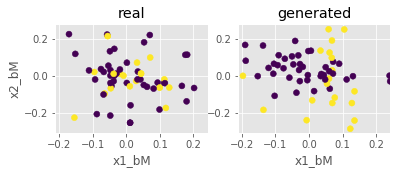

Step: 23100 of 50001.
Losses: G, D Gen, D Real: 1.3150, 0.3834, 0.4042
D Real - D Gen: 0.0208


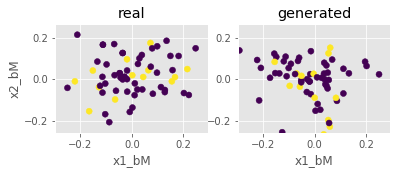

Step: 23200 of 50001.
Losses: G, D Gen, D Real: 1.3199, 0.3968, 0.3860
D Real - D Gen: -0.0108


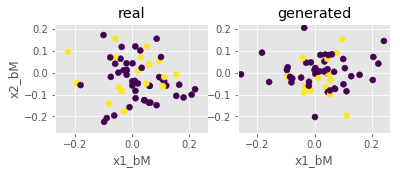

Step: 23300 of 50001.
Losses: G, D Gen, D Real: 1.2942, 0.3931, 0.4479
D Real - D Gen: 0.0548


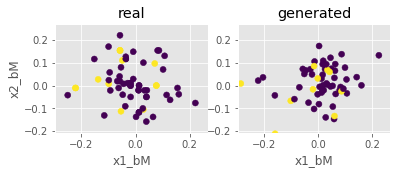

Step: 23400 of 50001.
Losses: G, D Gen, D Real: 1.3816, 0.4558, 0.4104
D Real - D Gen: -0.0454


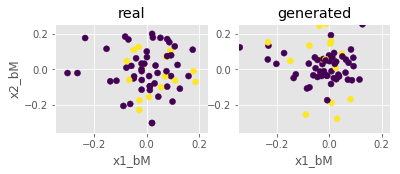

Step: 23500 of 50001.
Losses: G, D Gen, D Real: 1.3054, 0.3257, 0.3369
D Real - D Gen: 0.0112


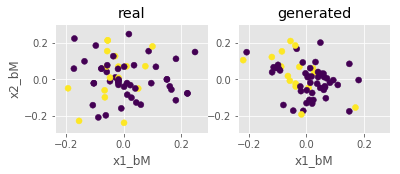

Step: 23600 of 50001.
Losses: G, D Gen, D Real: 1.3147, 0.4264, 0.4499
D Real - D Gen: 0.0235


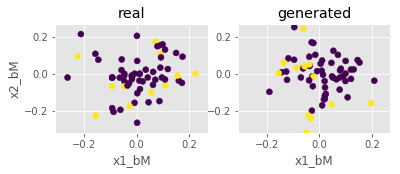

Step: 23700 of 50001.
Losses: G, D Gen, D Real: 1.3442, 0.3710, 0.3477
D Real - D Gen: -0.0233


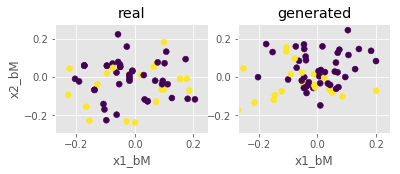

Step: 23800 of 50001.
Losses: G, D Gen, D Real: 1.3024, 0.4053, 0.4277
D Real - D Gen: 0.0224


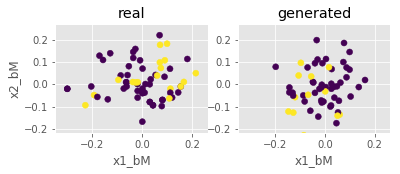

Step: 23900 of 50001.
Losses: G, D Gen, D Real: 1.3296, 0.4243, 0.4155
D Real - D Gen: -0.0089


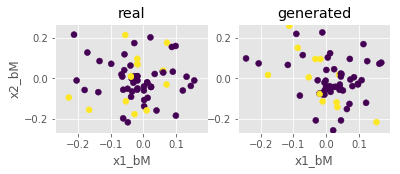

Step: 24000 of 50001.
Losses: G, D Gen, D Real: 1.2617, 0.3484, 0.4020
D Real - D Gen: 0.0535


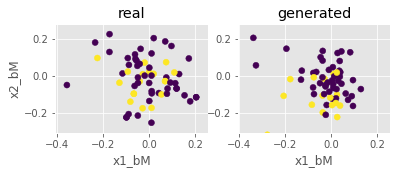

Step: 24100 of 50001.
Losses: G, D Gen, D Real: 1.3576, 0.3336, 0.3445
D Real - D Gen: 0.0109


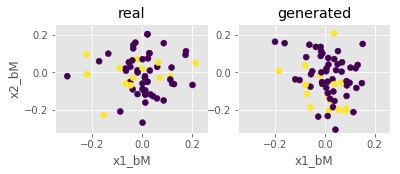

Step: 24200 of 50001.
Losses: G, D Gen, D Real: 1.4701, 0.3227, 0.3347
D Real - D Gen: 0.0120


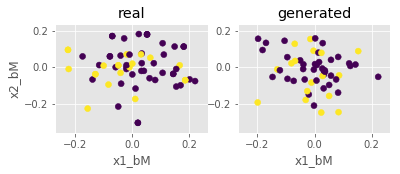

Step: 24300 of 50001.
Losses: G, D Gen, D Real: 1.3662, 0.3420, 0.4167
D Real - D Gen: 0.0747


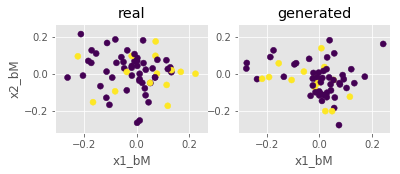

Step: 24400 of 50001.
Losses: G, D Gen, D Real: 1.3867, 0.3203, 0.3731
D Real - D Gen: 0.0528


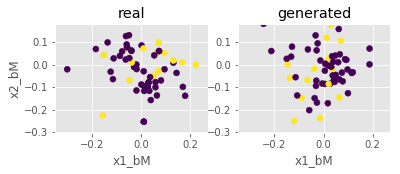

Step: 24500 of 50001.
Losses: G, D Gen, D Real: 1.5029, 0.3645, 0.4201
D Real - D Gen: 0.0557


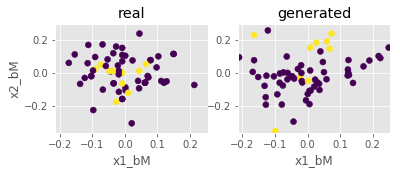

Step: 24600 of 50001.
Losses: G, D Gen, D Real: 1.5433, 0.3738, 0.3485
D Real - D Gen: -0.0253


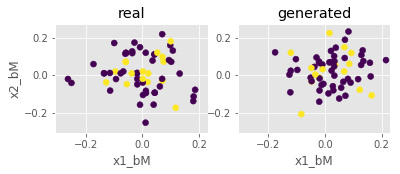

Step: 24700 of 50001.
Losses: G, D Gen, D Real: 1.5549, 0.3751, 0.3466
D Real - D Gen: -0.0285


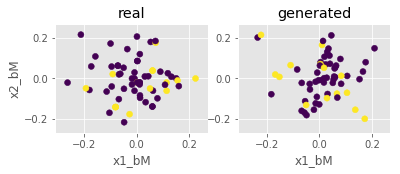

Step: 24800 of 50001.
Losses: G, D Gen, D Real: 1.3590, 0.3016, 0.4118
D Real - D Gen: 0.1102


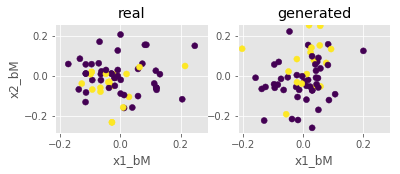

Step: 24900 of 50001.
Losses: G, D Gen, D Real: 1.4415, 0.3295, 0.3763
D Real - D Gen: 0.0468


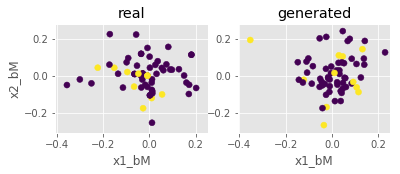

Step: 25000 of 50001.
Losses: G, D Gen, D Real: 1.5105, 0.3125, 0.3896
D Real - D Gen: 0.0771


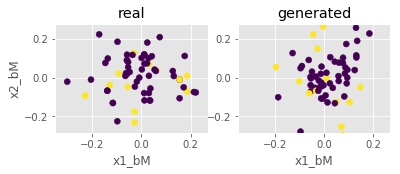

Step: 25100 of 50001.
Losses: G, D Gen, D Real: 1.5289, 0.3788, 0.3530
D Real - D Gen: -0.0258


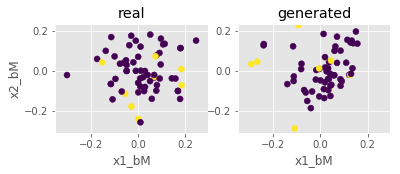

Step: 25200 of 50001.
Losses: G, D Gen, D Real: 1.5835, 0.3488, 0.3498
D Real - D Gen: 0.0010


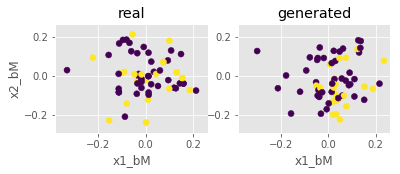

Step: 25300 of 50001.
Losses: G, D Gen, D Real: 1.4816, 0.3801, 0.3432
D Real - D Gen: -0.0369


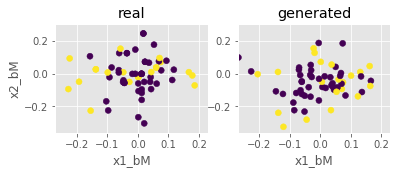

Step: 25400 of 50001.
Losses: G, D Gen, D Real: 1.5834, 0.3306, 0.2969
D Real - D Gen: -0.0337


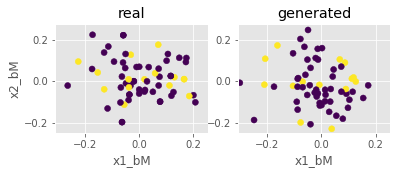

Step: 25500 of 50001.
Losses: G, D Gen, D Real: 1.6563, 0.3429, 0.3353
D Real - D Gen: -0.0077


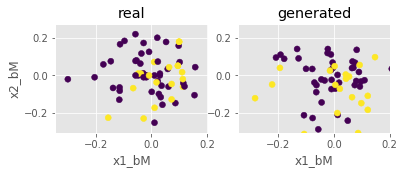

Step: 25600 of 50001.
Losses: G, D Gen, D Real: 1.4019, 0.4083, 0.4141
D Real - D Gen: 0.0058


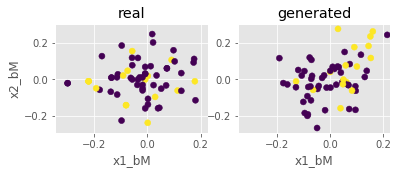

Step: 25700 of 50001.
Losses: G, D Gen, D Real: 1.4238, 0.4144, 0.3731
D Real - D Gen: -0.0413


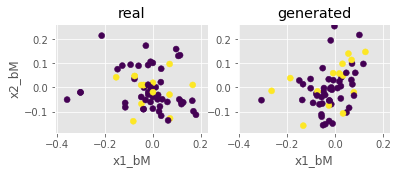

Step: 25800 of 50001.
Losses: G, D Gen, D Real: 1.3718, 0.4268, 0.4132
D Real - D Gen: -0.0137


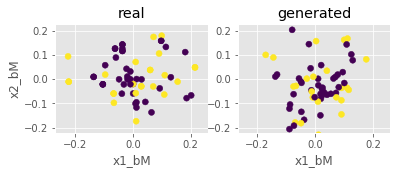

Step: 25900 of 50001.
Losses: G, D Gen, D Real: 1.3417, 0.4284, 0.3736
D Real - D Gen: -0.0548


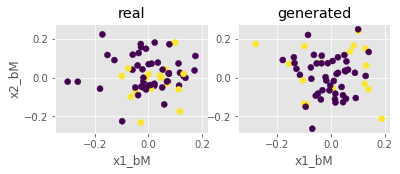

Step: 26000 of 50001.
Losses: G, D Gen, D Real: 1.4800, 0.3567, 0.3519
D Real - D Gen: -0.0048


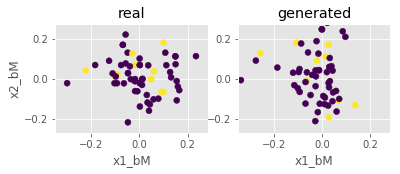

Step: 26100 of 50001.
Losses: G, D Gen, D Real: 1.5372, 0.3372, 0.3271
D Real - D Gen: -0.0101


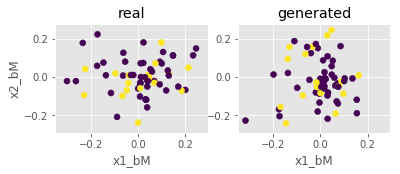

Step: 26200 of 50001.
Losses: G, D Gen, D Real: 1.6234, 0.2951, 0.2919
D Real - D Gen: -0.0031


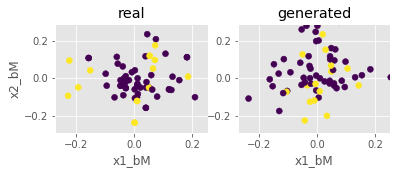

Step: 26300 of 50001.
Losses: G, D Gen, D Real: 1.6066, 0.3629, 0.3129
D Real - D Gen: -0.0501


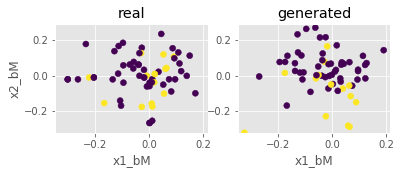

Step: 26400 of 50001.
Losses: G, D Gen, D Real: 1.4900, 0.3753, 0.3260
D Real - D Gen: -0.0493


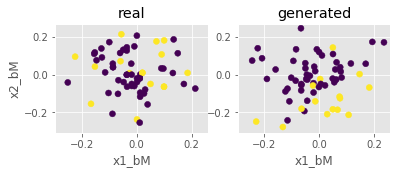

Step: 26500 of 50001.
Losses: G, D Gen, D Real: 1.2650, 0.3827, 0.4168
D Real - D Gen: 0.0341


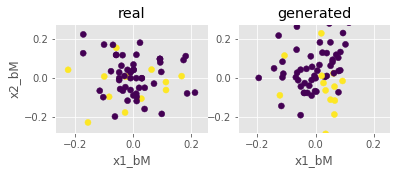

Step: 26600 of 50001.
Losses: G, D Gen, D Real: 1.5024, 0.3287, 0.3478
D Real - D Gen: 0.0191


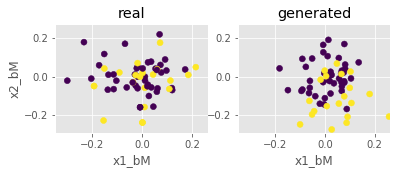

Step: 26700 of 50001.
Losses: G, D Gen, D Real: 1.4544, 0.3495, 0.3966
D Real - D Gen: 0.0471


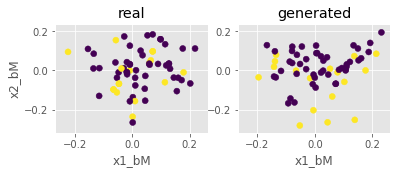

Step: 26800 of 50001.
Losses: G, D Gen, D Real: 1.5222, 0.3200, 0.3253
D Real - D Gen: 0.0053


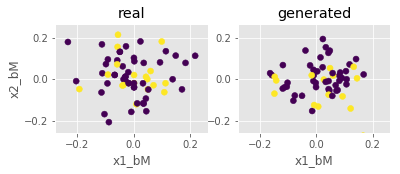

Step: 26900 of 50001.
Losses: G, D Gen, D Real: 1.6661, 0.3771, 0.3669
D Real - D Gen: -0.0102


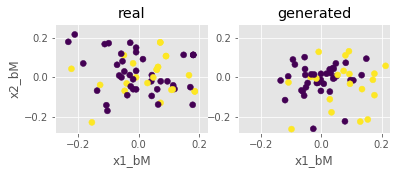

Step: 27000 of 50001.
Losses: G, D Gen, D Real: 1.5369, 0.3212, 0.3634
D Real - D Gen: 0.0422


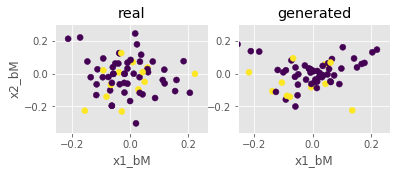

Step: 27100 of 50001.
Losses: G, D Gen, D Real: 1.3154, 0.2999, 0.3521
D Real - D Gen: 0.0523


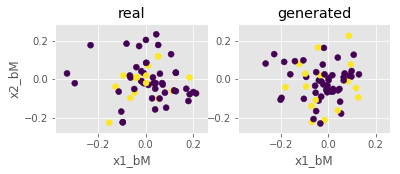

Step: 27200 of 50001.
Losses: G, D Gen, D Real: 1.4397, 0.3473, 0.3973
D Real - D Gen: 0.0501


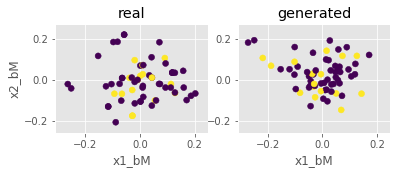

Step: 27300 of 50001.
Losses: G, D Gen, D Real: 1.6015, 0.4061, 0.4102
D Real - D Gen: 0.0041


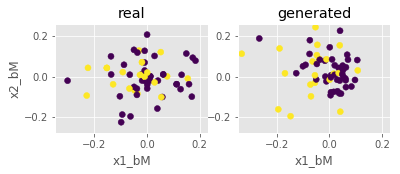

Step: 27400 of 50001.
Losses: G, D Gen, D Real: 1.5268, 0.3664, 0.4026
D Real - D Gen: 0.0362


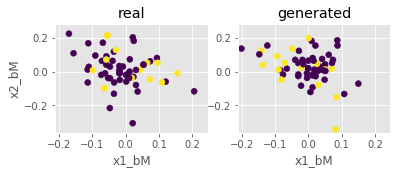

Step: 27500 of 50001.
Losses: G, D Gen, D Real: 1.3863, 0.2700, 0.3138
D Real - D Gen: 0.0438


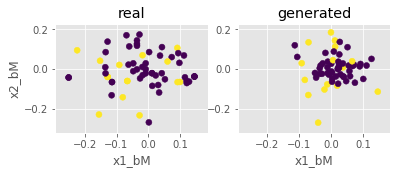

Step: 27600 of 50001.
Losses: G, D Gen, D Real: 1.4804, 0.3723, 0.3525
D Real - D Gen: -0.0198


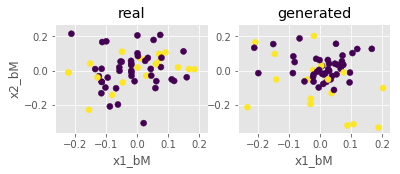

Step: 27700 of 50001.
Losses: G, D Gen, D Real: 1.6350, 0.3386, 0.2781
D Real - D Gen: -0.0606


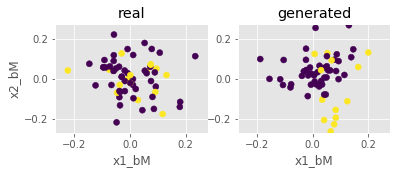

Step: 27800 of 50001.
Losses: G, D Gen, D Real: 1.4997, 0.2974, 0.4249
D Real - D Gen: 0.1276


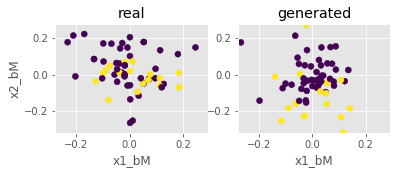

Step: 27900 of 50001.
Losses: G, D Gen, D Real: 1.6100, 0.3355, 0.3236
D Real - D Gen: -0.0119


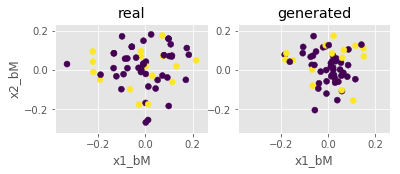

Step: 28000 of 50001.
Losses: G, D Gen, D Real: 1.5469, 0.3042, 0.3290
D Real - D Gen: 0.0248


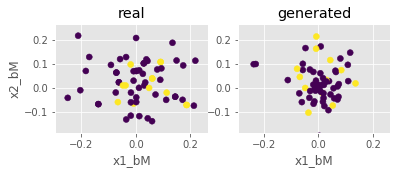

Step: 28100 of 50001.
Losses: G, D Gen, D Real: 1.3598, 0.3253, 0.3853
D Real - D Gen: 0.0600


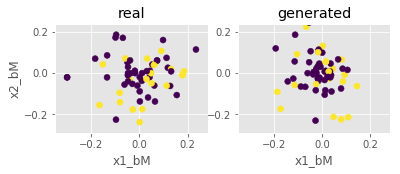

Step: 28200 of 50001.
Losses: G, D Gen, D Real: 1.6837, 0.2770, 0.3879
D Real - D Gen: 0.1109


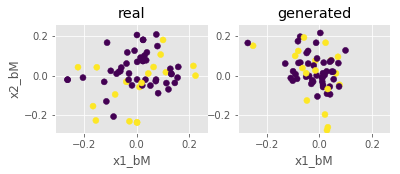

Step: 28300 of 50001.
Losses: G, D Gen, D Real: 1.5804, 0.2780, 0.4284
D Real - D Gen: 0.1504


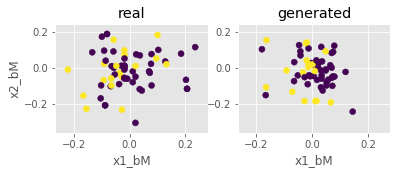

Step: 28400 of 50001.
Losses: G, D Gen, D Real: 1.6274, 0.3316, 0.3210
D Real - D Gen: -0.0106


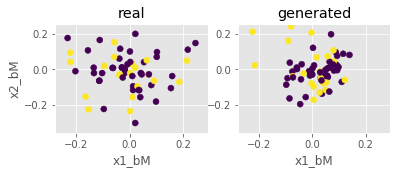

Step: 28500 of 50001.
Losses: G, D Gen, D Real: 1.5754, 0.3261, 0.3724
D Real - D Gen: 0.0463


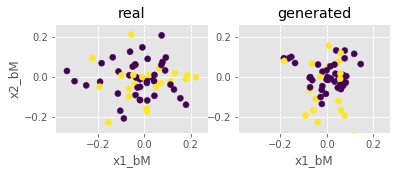

Step: 28600 of 50001.
Losses: G, D Gen, D Real: 1.4714, 0.3117, 0.4084
D Real - D Gen: 0.0967


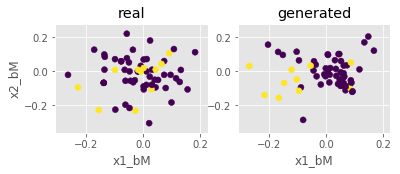

Step: 28700 of 50001.
Losses: G, D Gen, D Real: 1.6144, 0.3309, 0.3894
D Real - D Gen: 0.0585


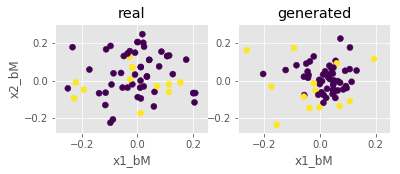

Step: 28800 of 50001.
Losses: G, D Gen, D Real: 1.5333, 0.3376, 0.3696
D Real - D Gen: 0.0320


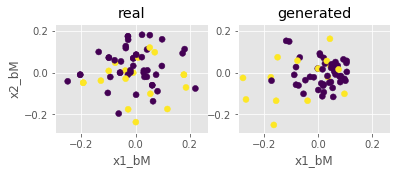

Step: 28900 of 50001.
Losses: G, D Gen, D Real: 1.5952, 0.3469, 0.3848
D Real - D Gen: 0.0379


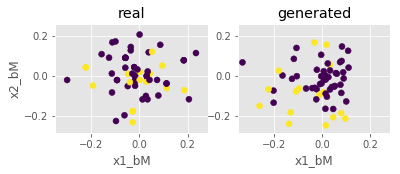

Step: 29000 of 50001.
Losses: G, D Gen, D Real: 1.6045, 0.3146, 0.3810
D Real - D Gen: 0.0664


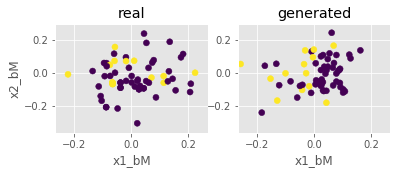

Step: 29100 of 50001.
Losses: G, D Gen, D Real: 1.5047, 0.3741, 0.4162
D Real - D Gen: 0.0421


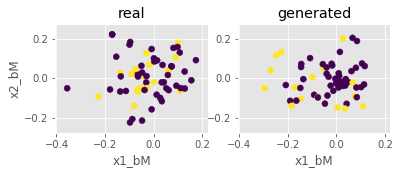

Step: 29200 of 50001.
Losses: G, D Gen, D Real: 1.5203, 0.2762, 0.4008
D Real - D Gen: 0.1246


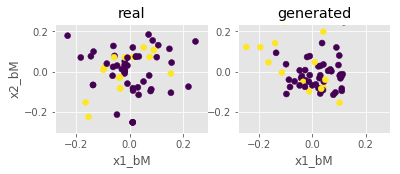

Step: 29300 of 50001.
Losses: G, D Gen, D Real: 1.4974, 0.3306, 0.3751
D Real - D Gen: 0.0444


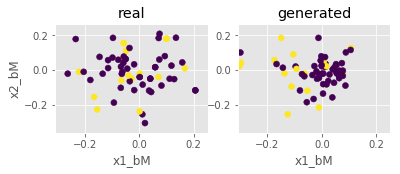

Step: 29400 of 50001.
Losses: G, D Gen, D Real: 1.6362, 0.3159, 0.3431
D Real - D Gen: 0.0272


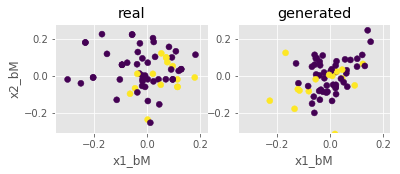

Step: 29500 of 50001.
Losses: G, D Gen, D Real: 1.6848, 0.3709, 0.3531
D Real - D Gen: -0.0178


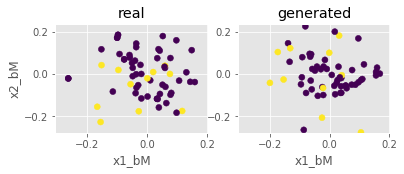

Step: 29600 of 50001.
Losses: G, D Gen, D Real: 1.7119, 0.3147, 0.3244
D Real - D Gen: 0.0096


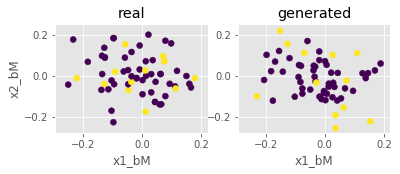

Step: 29700 of 50001.
Losses: G, D Gen, D Real: 1.6374, 0.3829, 0.4037
D Real - D Gen: 0.0208


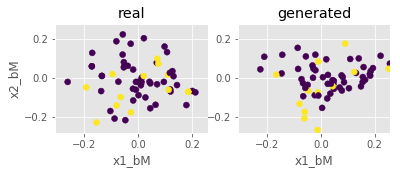

Step: 29800 of 50001.
Losses: G, D Gen, D Real: 1.6815, 0.3217, 0.3617
D Real - D Gen: 0.0400


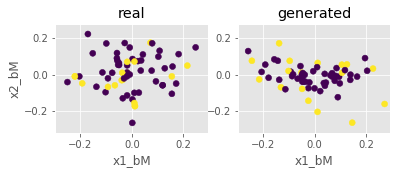

Step: 29900 of 50001.
Losses: G, D Gen, D Real: 1.6455, 0.2699, 0.2559
D Real - D Gen: -0.0140


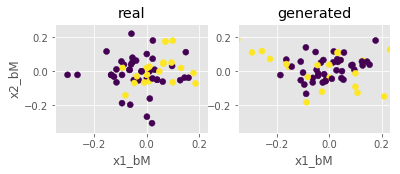

Step: 30000 of 50001.
Losses: G, D Gen, D Real: 1.7325, 0.2937, 0.3060
D Real - D Gen: 0.0123


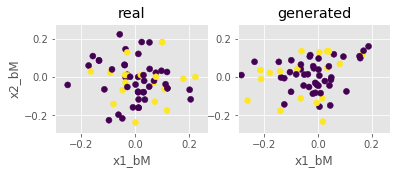

Step: 30100 of 50001.
Losses: G, D Gen, D Real: 1.5180, 0.3386, 0.3448
D Real - D Gen: 0.0062


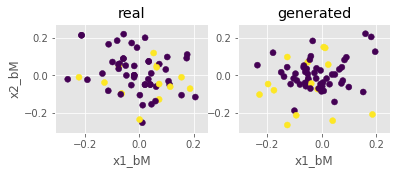

Step: 30200 of 50001.
Losses: G, D Gen, D Real: 1.5905, 0.3310, 0.3485
D Real - D Gen: 0.0175


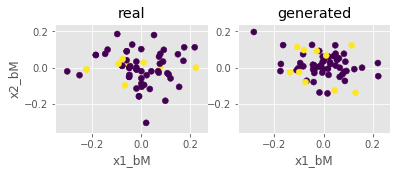

Step: 30300 of 50001.
Losses: G, D Gen, D Real: 1.4639, 0.3284, 0.3386
D Real - D Gen: 0.0102


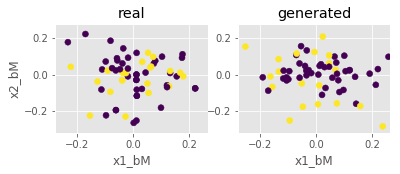

Step: 30400 of 50001.
Losses: G, D Gen, D Real: 1.7539, 0.3226, 0.3399
D Real - D Gen: 0.0173


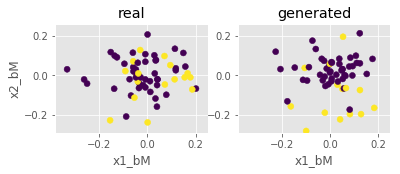

Step: 30500 of 50001.
Losses: G, D Gen, D Real: 1.7309, 0.3065, 0.3034
D Real - D Gen: -0.0032


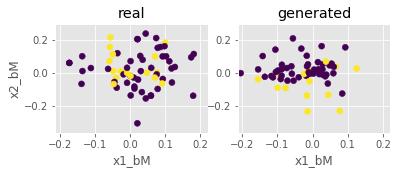

Step: 30600 of 50001.
Losses: G, D Gen, D Real: 1.6758, 0.3529, 0.3423
D Real - D Gen: -0.0107


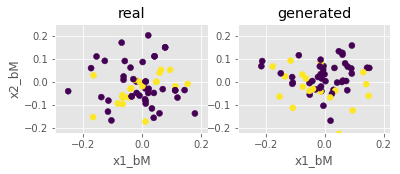

Step: 30700 of 50001.
Losses: G, D Gen, D Real: 1.6120, 0.2628, 0.3549
D Real - D Gen: 0.0921


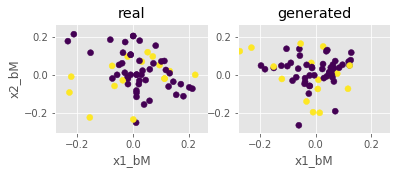

Step: 30800 of 50001.
Losses: G, D Gen, D Real: 1.8309, 0.2879, 0.3102
D Real - D Gen: 0.0223


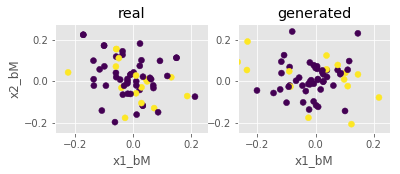

Step: 30900 of 50001.
Losses: G, D Gen, D Real: 1.6136, 0.3371, 0.4297
D Real - D Gen: 0.0926


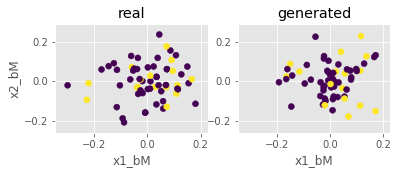

Step: 31000 of 50001.
Losses: G, D Gen, D Real: 1.6362, 0.2520, 0.3075
D Real - D Gen: 0.0556


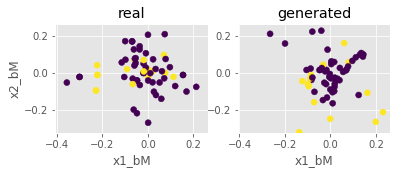

Step: 31100 of 50001.
Losses: G, D Gen, D Real: 1.5645, 0.3159, 0.3158
D Real - D Gen: -0.0001


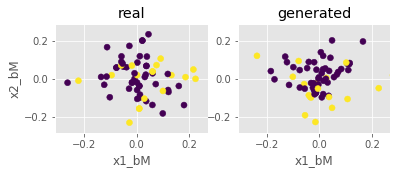

Step: 31200 of 50001.
Losses: G, D Gen, D Real: 1.6746, 0.3134, 0.2766
D Real - D Gen: -0.0368


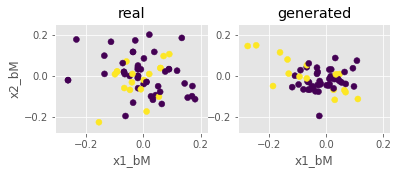

Step: 31300 of 50001.
Losses: G, D Gen, D Real: 1.6820, 0.3259, 0.2966
D Real - D Gen: -0.0294


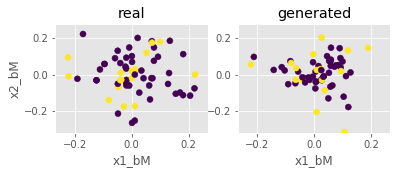

Step: 31400 of 50001.
Losses: G, D Gen, D Real: 1.5478, 0.3095, 0.2553
D Real - D Gen: -0.0542


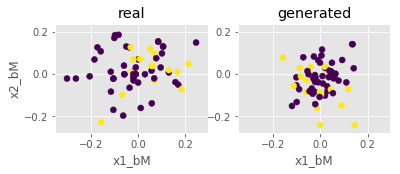

Step: 31500 of 50001.
Losses: G, D Gen, D Real: 1.6800, 0.3436, 0.2979
D Real - D Gen: -0.0457


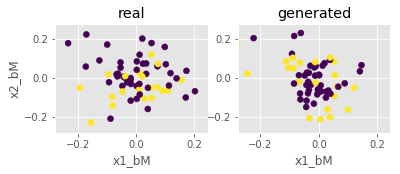

Step: 31600 of 50001.
Losses: G, D Gen, D Real: 1.5788, 0.3011, 0.2995
D Real - D Gen: -0.0016


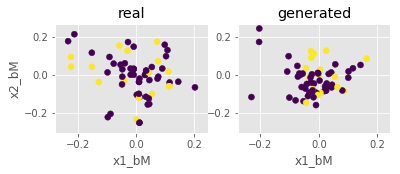

Step: 31700 of 50001.
Losses: G, D Gen, D Real: 1.5342, 0.2736, 0.3489
D Real - D Gen: 0.0753


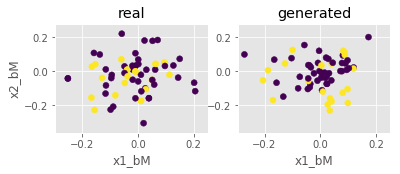

Step: 31800 of 50001.
Losses: G, D Gen, D Real: 1.8314, 0.2827, 0.2759
D Real - D Gen: -0.0068


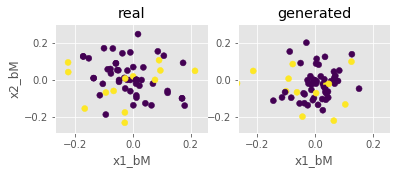

Step: 31900 of 50001.
Losses: G, D Gen, D Real: 1.6564, 0.2802, 0.3257
D Real - D Gen: 0.0456


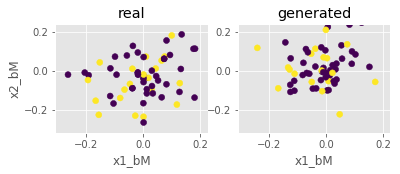

Step: 32000 of 50001.
Losses: G, D Gen, D Real: 1.6221, 0.2940, 0.3117
D Real - D Gen: 0.0177


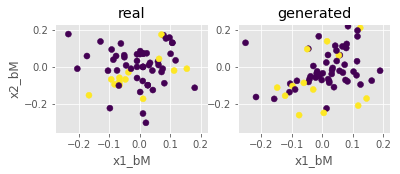

Step: 32100 of 50001.
Losses: G, D Gen, D Real: 1.6625, 0.3233, 0.3172
D Real - D Gen: -0.0061


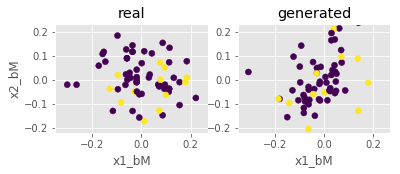

Step: 32200 of 50001.
Losses: G, D Gen, D Real: 1.6862, 0.2838, 0.3224
D Real - D Gen: 0.0385


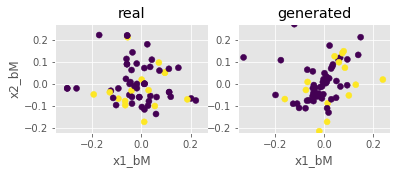

Step: 32300 of 50001.
Losses: G, D Gen, D Real: 1.8989, 0.2482, 0.3402
D Real - D Gen: 0.0920


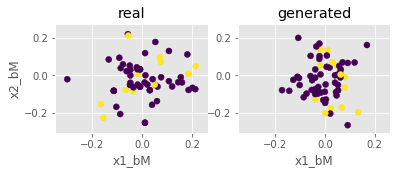

Step: 32400 of 50001.
Losses: G, D Gen, D Real: 1.6923, 0.2606, 0.3389
D Real - D Gen: 0.0783


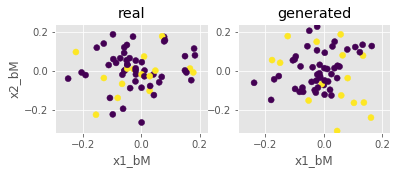

Step: 32500 of 50001.
Losses: G, D Gen, D Real: 1.6560, 0.3122, 0.3221
D Real - D Gen: 0.0099


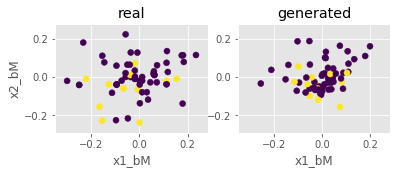

Step: 32600 of 50001.
Losses: G, D Gen, D Real: 1.7814, 0.2715, 0.3350
D Real - D Gen: 0.0635


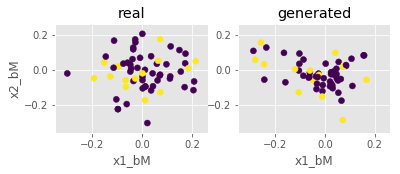

Step: 32700 of 50001.
Losses: G, D Gen, D Real: 1.7974, 0.3429, 0.2823
D Real - D Gen: -0.0606


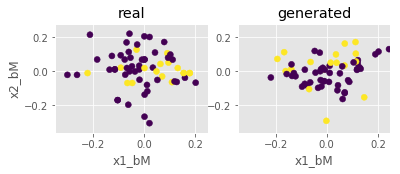

Step: 32800 of 50001.
Losses: G, D Gen, D Real: 1.9465, 0.2707, 0.2951
D Real - D Gen: 0.0244


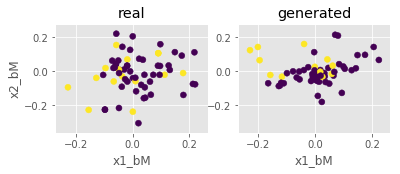

Step: 32900 of 50001.
Losses: G, D Gen, D Real: 1.7958, 0.2830, 0.2847
D Real - D Gen: 0.0017


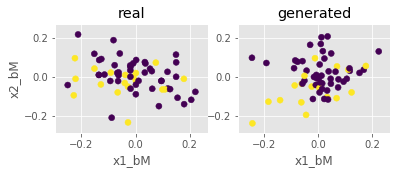

Step: 33000 of 50001.
Losses: G, D Gen, D Real: 1.7892, 0.3059, 0.2728
D Real - D Gen: -0.0331


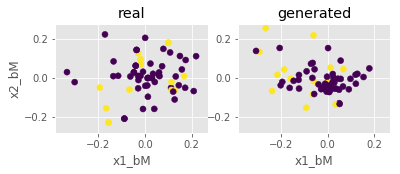

Step: 33100 of 50001.
Losses: G, D Gen, D Real: 1.6899, 0.3911, 0.3968
D Real - D Gen: 0.0057


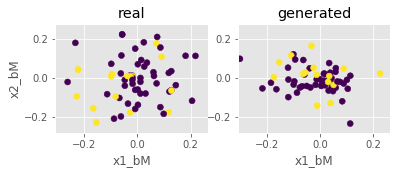

Step: 33200 of 50001.
Losses: G, D Gen, D Real: 1.8624, 0.3656, 0.2885
D Real - D Gen: -0.0772


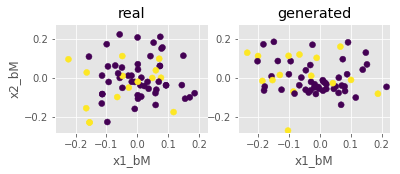

Step: 33300 of 50001.
Losses: G, D Gen, D Real: 1.8029, 0.2642, 0.3078
D Real - D Gen: 0.0436


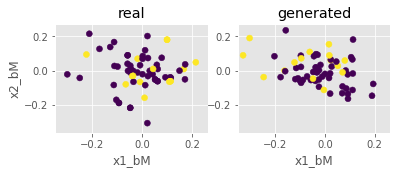

Step: 33400 of 50001.
Losses: G, D Gen, D Real: 1.7784, 0.2998, 0.3231
D Real - D Gen: 0.0233


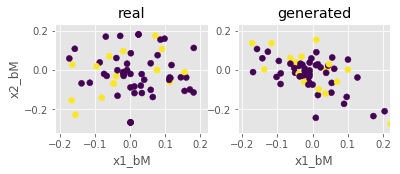

Step: 33500 of 50001.
Losses: G, D Gen, D Real: 1.8448, 0.2347, 0.2387
D Real - D Gen: 0.0040


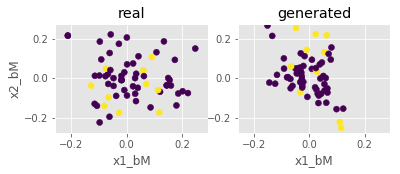

Step: 33600 of 50001.
Losses: G, D Gen, D Real: 1.7294, 0.2703, 0.3053
D Real - D Gen: 0.0350


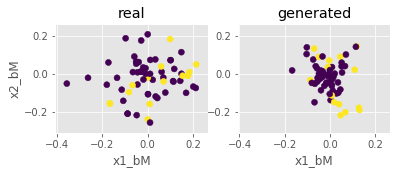

Step: 33700 of 50001.
Losses: G, D Gen, D Real: 1.6335, 0.3000, 0.4106
D Real - D Gen: 0.1107


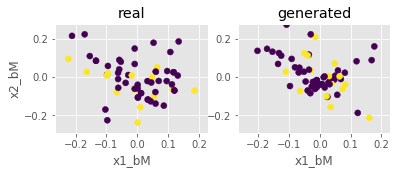

Step: 33800 of 50001.
Losses: G, D Gen, D Real: 1.6675, 0.2317, 0.2587
D Real - D Gen: 0.0270


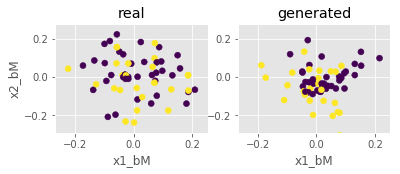

Step: 33900 of 50001.
Losses: G, D Gen, D Real: 1.9058, 0.3084, 0.2957
D Real - D Gen: -0.0127


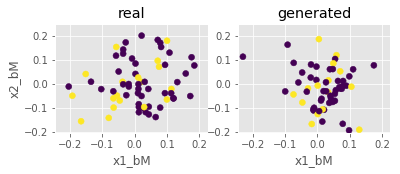

Step: 34000 of 50001.
Losses: G, D Gen, D Real: 1.8377, 0.2643, 0.2599
D Real - D Gen: -0.0044


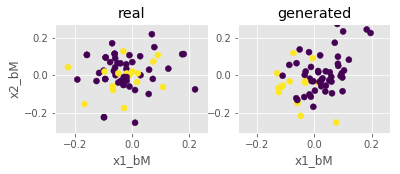

Step: 34100 of 50001.
Losses: G, D Gen, D Real: 1.8270, 0.3137, 0.2740
D Real - D Gen: -0.0397


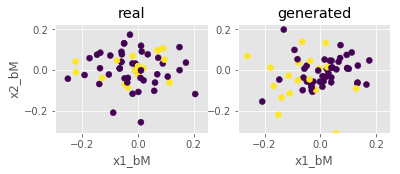

Step: 34200 of 50001.
Losses: G, D Gen, D Real: 1.9971, 0.2780, 0.3626
D Real - D Gen: 0.0846


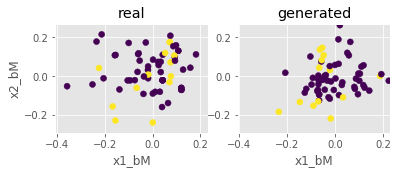

Step: 34300 of 50001.
Losses: G, D Gen, D Real: 2.0023, 0.2102, 0.3290
D Real - D Gen: 0.1188


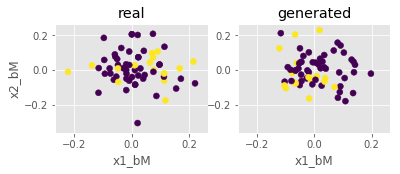

Step: 34400 of 50001.
Losses: G, D Gen, D Real: 2.0413, 0.3145, 0.3176
D Real - D Gen: 0.0031


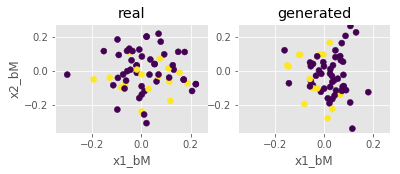

Step: 34500 of 50001.
Losses: G, D Gen, D Real: 1.8919, 0.2982, 0.2813
D Real - D Gen: -0.0169


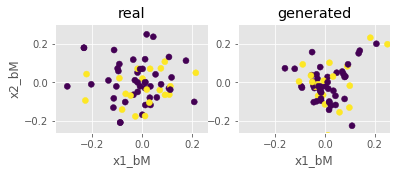

Step: 34600 of 50001.
Losses: G, D Gen, D Real: 1.8061, 0.2704, 0.3109
D Real - D Gen: 0.0406


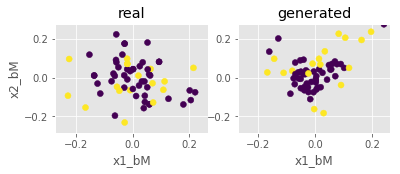

Step: 34700 of 50001.
Losses: G, D Gen, D Real: 1.6135, 0.2909, 0.3373
D Real - D Gen: 0.0464


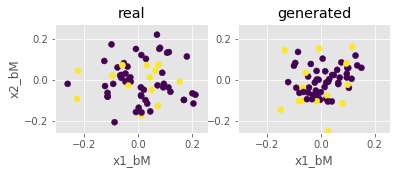

Step: 34800 of 50001.
Losses: G, D Gen, D Real: 1.8369, 0.2813, 0.2591
D Real - D Gen: -0.0222


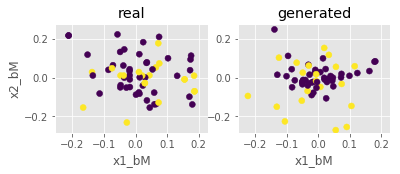

Step: 34900 of 50001.
Losses: G, D Gen, D Real: 1.8008, 0.2386, 0.2439
D Real - D Gen: 0.0053


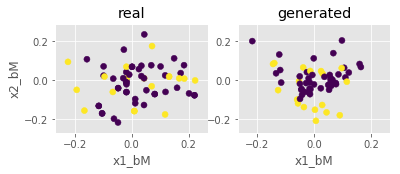

Step: 35000 of 50001.
Losses: G, D Gen, D Real: 2.0805, 0.2536, 0.2271
D Real - D Gen: -0.0266


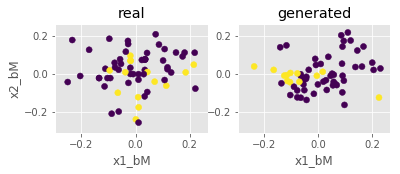

Step: 35100 of 50001.
Losses: G, D Gen, D Real: 2.0873, 0.2985, 0.2175
D Real - D Gen: -0.0810


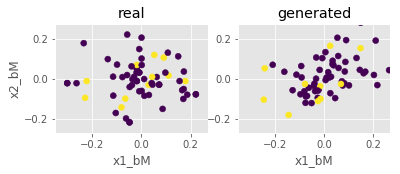

Step: 35200 of 50001.
Losses: G, D Gen, D Real: 1.9607, 0.3170, 0.2222
D Real - D Gen: -0.0948


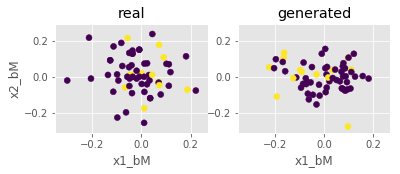

Step: 35300 of 50001.
Losses: G, D Gen, D Real: 1.7770, 0.3067, 0.3439
D Real - D Gen: 0.0372


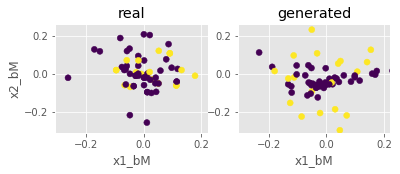

Step: 35400 of 50001.
Losses: G, D Gen, D Real: 1.7611, 0.2397, 0.2474
D Real - D Gen: 0.0077


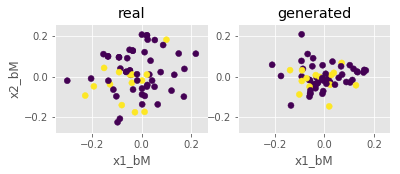

Step: 35500 of 50001.
Losses: G, D Gen, D Real: 1.6930, 0.3004, 0.2890
D Real - D Gen: -0.0114


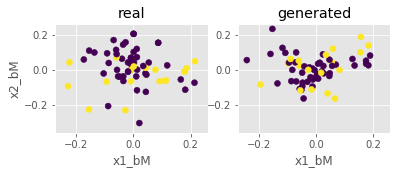

Step: 35600 of 50001.
Losses: G, D Gen, D Real: 1.8990, 0.3096, 0.2701
D Real - D Gen: -0.0395


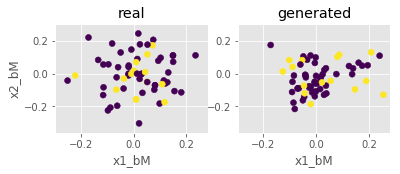

Step: 35700 of 50001.
Losses: G, D Gen, D Real: 1.6995, 0.2797, 0.3307
D Real - D Gen: 0.0510


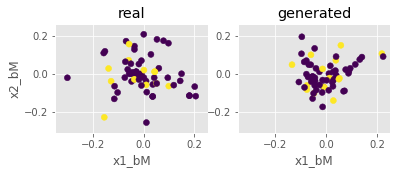

Step: 35800 of 50001.
Losses: G, D Gen, D Real: 2.0280, 0.3058, 0.2914
D Real - D Gen: -0.0144


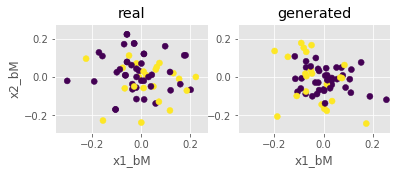

Step: 35900 of 50001.
Losses: G, D Gen, D Real: 1.8468, 0.3033, 0.2694
D Real - D Gen: -0.0339


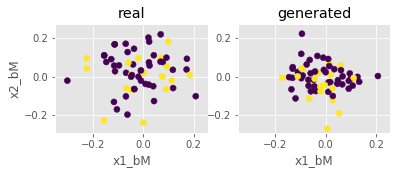

Step: 36000 of 50001.
Losses: G, D Gen, D Real: 1.9196, 0.2151, 0.2666
D Real - D Gen: 0.0515


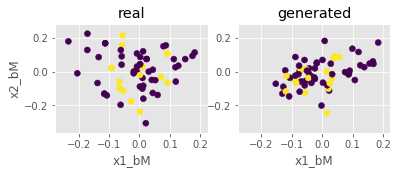

Step: 36100 of 50001.
Losses: G, D Gen, D Real: 1.7876, 0.2840, 0.2979
D Real - D Gen: 0.0139


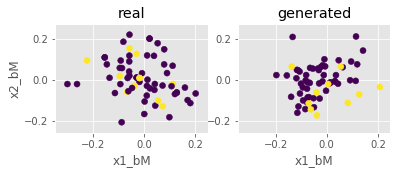

Step: 36200 of 50001.
Losses: G, D Gen, D Real: 1.8318, 0.2628, 0.3623
D Real - D Gen: 0.0995


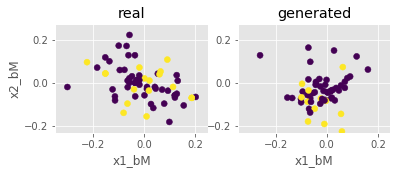

Step: 36300 of 50001.
Losses: G, D Gen, D Real: 1.7778, 0.2899, 0.3732
D Real - D Gen: 0.0833


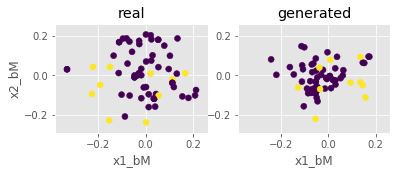

Step: 36400 of 50001.
Losses: G, D Gen, D Real: 1.9648, 0.2575, 0.3304
D Real - D Gen: 0.0728


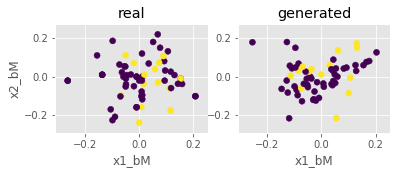

Step: 36500 of 50001.
Losses: G, D Gen, D Real: 2.2392, 0.1857, 0.2667
D Real - D Gen: 0.0810


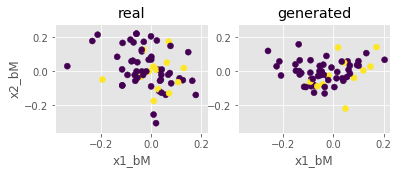

Step: 36600 of 50001.
Losses: G, D Gen, D Real: 1.9112, 0.3071, 0.2720
D Real - D Gen: -0.0351


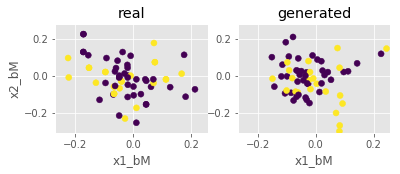

Step: 36700 of 50001.
Losses: G, D Gen, D Real: 1.8834, 0.2890, 0.2329
D Real - D Gen: -0.0561


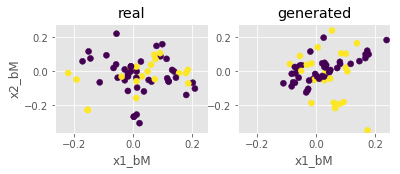

Step: 36800 of 50001.
Losses: G, D Gen, D Real: 1.9514, 0.3235, 0.2515
D Real - D Gen: -0.0720


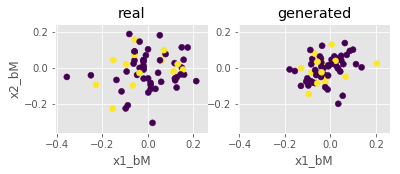

Step: 36900 of 50001.
Losses: G, D Gen, D Real: 1.7857, 0.2516, 0.2574
D Real - D Gen: 0.0059


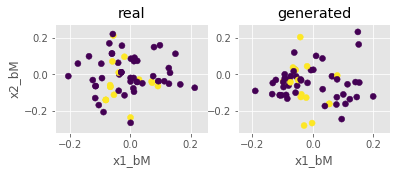

Step: 37000 of 50001.
Losses: G, D Gen, D Real: 2.1840, 0.2837, 0.1895
D Real - D Gen: -0.0942


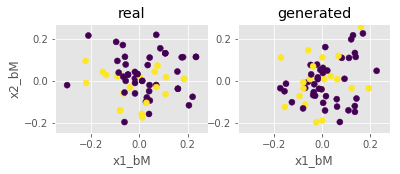

Step: 37100 of 50001.
Losses: G, D Gen, D Real: 2.2370, 0.3439, 0.1962
D Real - D Gen: -0.1476


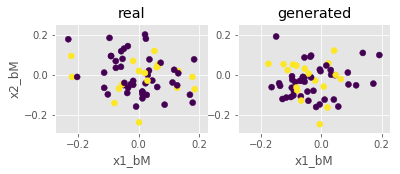

Step: 37200 of 50001.
Losses: G, D Gen, D Real: 1.6151, 0.2838, 0.3732
D Real - D Gen: 0.0894


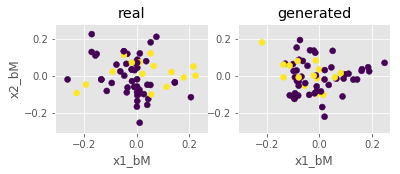

Step: 37300 of 50001.
Losses: G, D Gen, D Real: 1.9688, 0.2259, 0.3074
D Real - D Gen: 0.0814


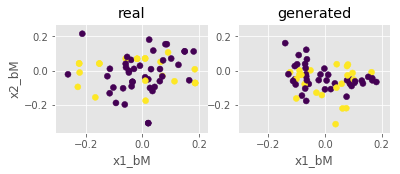

Step: 37400 of 50001.
Losses: G, D Gen, D Real: 2.0359, 0.2470, 0.2282
D Real - D Gen: -0.0188


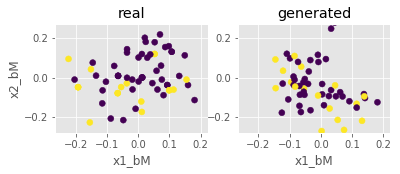

Step: 37500 of 50001.
Losses: G, D Gen, D Real: 2.0073, 0.2954, 0.3268
D Real - D Gen: 0.0314


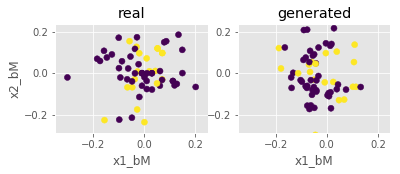

Step: 37600 of 50001.
Losses: G, D Gen, D Real: 2.1013, 0.1929, 0.2362
D Real - D Gen: 0.0433


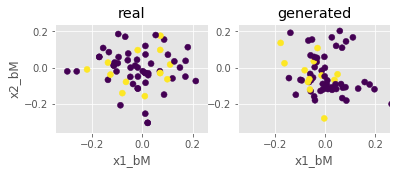

Step: 37700 of 50001.
Losses: G, D Gen, D Real: 1.9577, 0.2167, 0.2777
D Real - D Gen: 0.0609


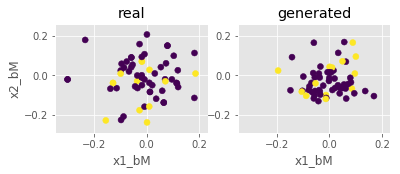

Step: 37800 of 50001.
Losses: G, D Gen, D Real: 1.8759, 0.2819, 0.3139
D Real - D Gen: 0.0320


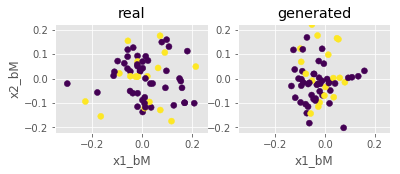

Step: 37900 of 50001.
Losses: G, D Gen, D Real: 2.0058, 0.2309, 0.2682
D Real - D Gen: 0.0372


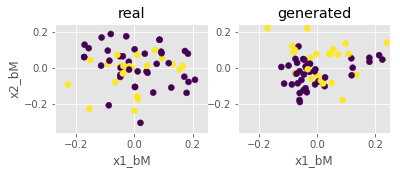

Step: 38000 of 50001.
Losses: G, D Gen, D Real: 2.0324, 0.2387, 0.4025
D Real - D Gen: 0.1638


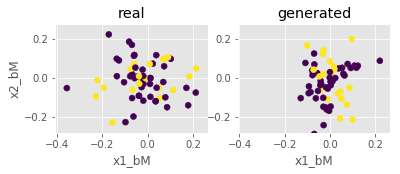

Step: 38100 of 50001.
Losses: G, D Gen, D Real: 2.1593, 0.2076, 0.2503
D Real - D Gen: 0.0427


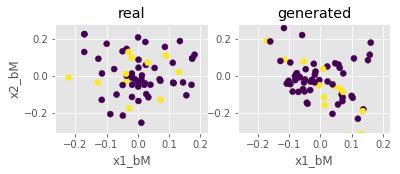

Step: 38200 of 50001.
Losses: G, D Gen, D Real: 1.9210, 0.2807, 0.2518
D Real - D Gen: -0.0289


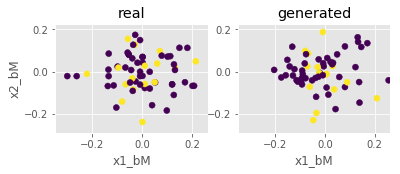

Step: 38300 of 50001.
Losses: G, D Gen, D Real: 1.8786, 0.3294, 0.3409
D Real - D Gen: 0.0115


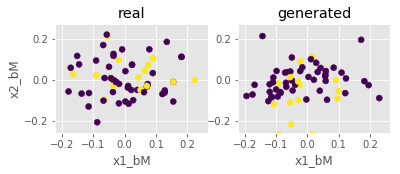

Step: 38400 of 50001.
Losses: G, D Gen, D Real: 1.9160, 0.2443, 0.2689
D Real - D Gen: 0.0246


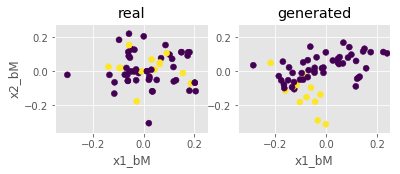

Step: 38500 of 50001.
Losses: G, D Gen, D Real: 2.1224, 0.2158, 0.1809
D Real - D Gen: -0.0349


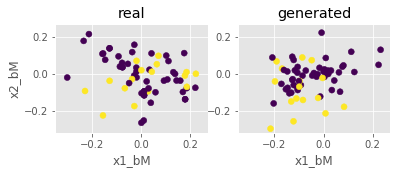

Step: 38600 of 50001.
Losses: G, D Gen, D Real: 2.1929, 0.2298, 0.3133
D Real - D Gen: 0.0835


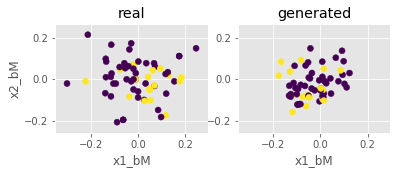

Step: 38700 of 50001.
Losses: G, D Gen, D Real: 2.3395, 0.2009, 0.2562
D Real - D Gen: 0.0553


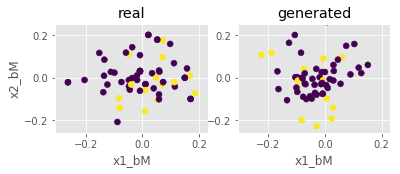

Step: 38800 of 50001.
Losses: G, D Gen, D Real: 2.2794, 0.2314, 0.2764
D Real - D Gen: 0.0450


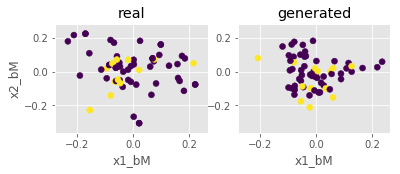

Step: 38900 of 50001.
Losses: G, D Gen, D Real: 1.9417, 0.2423, 0.2013
D Real - D Gen: -0.0410


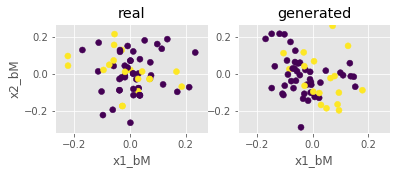

Step: 39000 of 50001.
Losses: G, D Gen, D Real: 1.9386, 0.2529, 0.2314
D Real - D Gen: -0.0214


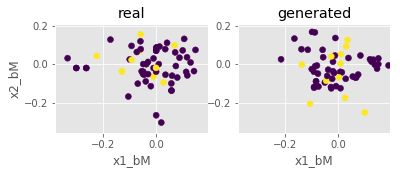

Step: 39100 of 50001.
Losses: G, D Gen, D Real: 2.0967, 0.2518, 0.3744
D Real - D Gen: 0.1226


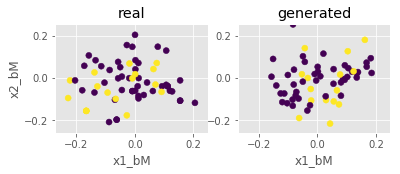

Step: 39200 of 50001.
Losses: G, D Gen, D Real: 2.1158, 0.2293, 0.2905
D Real - D Gen: 0.0612


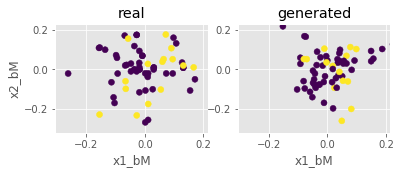

Step: 39300 of 50001.
Losses: G, D Gen, D Real: 2.1296, 0.2403, 0.2267
D Real - D Gen: -0.0136


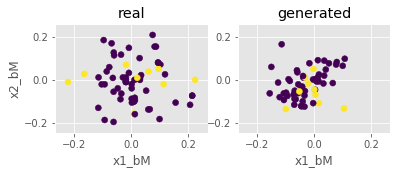

Step: 39400 of 50001.
Losses: G, D Gen, D Real: 1.9404, 0.3196, 0.2806
D Real - D Gen: -0.0390


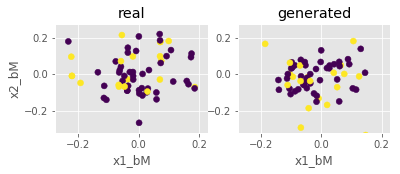

Step: 39500 of 50001.
Losses: G, D Gen, D Real: 2.0522, 0.2642, 0.3023
D Real - D Gen: 0.0381


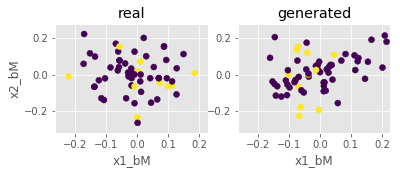

Step: 39600 of 50001.
Losses: G, D Gen, D Real: 1.9461, 0.2973, 0.2306
D Real - D Gen: -0.0667


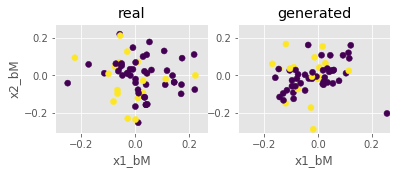

Step: 39700 of 50001.
Losses: G, D Gen, D Real: 1.9888, 0.2129, 0.2686
D Real - D Gen: 0.0557


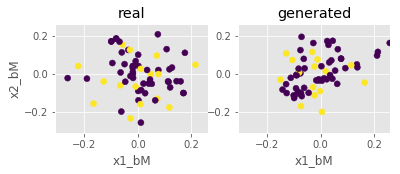

Step: 39800 of 50001.
Losses: G, D Gen, D Real: 1.9466, 0.2074, 0.3288
D Real - D Gen: 0.1214


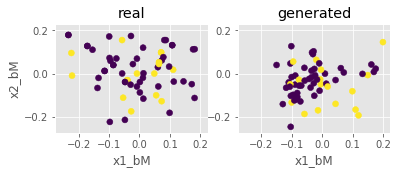

Step: 39900 of 50001.
Losses: G, D Gen, D Real: 1.9581, 0.2303, 0.2427
D Real - D Gen: 0.0124


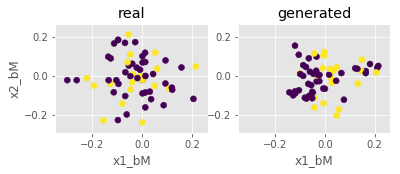

Step: 40000 of 50001.
Losses: G, D Gen, D Real: 2.0175, 0.1954, 0.1953
D Real - D Gen: -0.0000


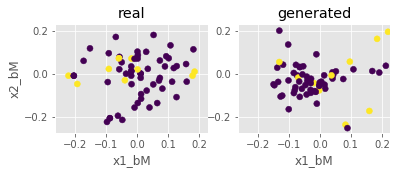

Step: 40100 of 50001.
Losses: G, D Gen, D Real: 2.3532, 0.2033, 0.2097
D Real - D Gen: 0.0064


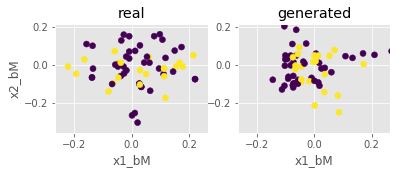

Step: 40200 of 50001.
Losses: G, D Gen, D Real: 2.0546, 0.2255, 0.2814
D Real - D Gen: 0.0559


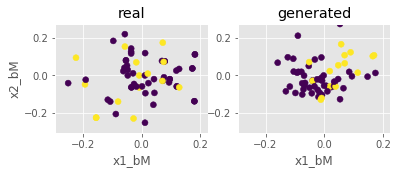

Step: 40300 of 50001.
Losses: G, D Gen, D Real: 2.0316, 0.2474, 0.2141
D Real - D Gen: -0.0333


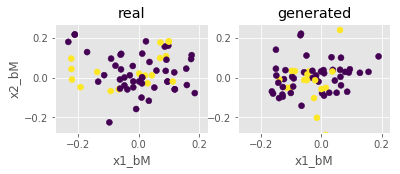

Step: 40400 of 50001.
Losses: G, D Gen, D Real: 2.0020, 0.2405, 0.2568
D Real - D Gen: 0.0163


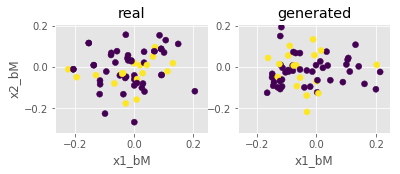

Step: 40500 of 50001.
Losses: G, D Gen, D Real: 2.1910, 0.2316, 0.2431
D Real - D Gen: 0.0115


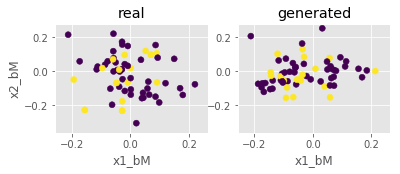

Step: 40600 of 50001.
Losses: G, D Gen, D Real: 2.1669, 0.2877, 0.2729
D Real - D Gen: -0.0148


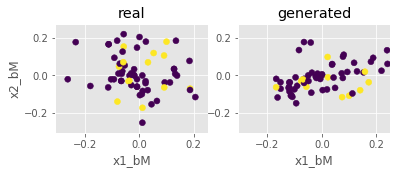

Step: 40700 of 50001.
Losses: G, D Gen, D Real: 2.3471, 0.2470, 0.2482
D Real - D Gen: 0.0013


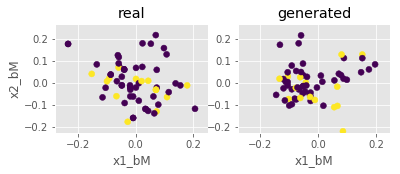

Step: 40800 of 50001.
Losses: G, D Gen, D Real: 2.3338, 0.1889, 0.2332
D Real - D Gen: 0.0443


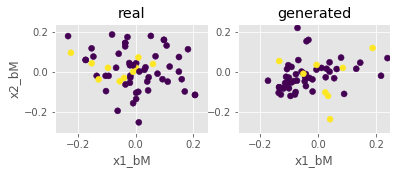

Step: 40900 of 50001.
Losses: G, D Gen, D Real: 2.3880, 0.2452, 0.2033
D Real - D Gen: -0.0419


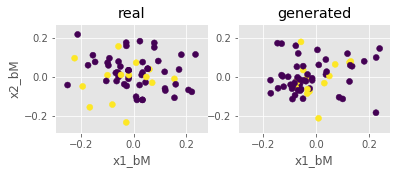

Step: 41000 of 50001.
Losses: G, D Gen, D Real: 2.5396, 0.2522, 0.1986
D Real - D Gen: -0.0536


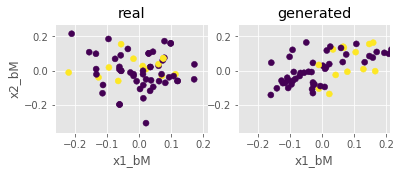

Step: 41100 of 50001.
Losses: G, D Gen, D Real: 2.1655, 0.2353, 0.1855
D Real - D Gen: -0.0498


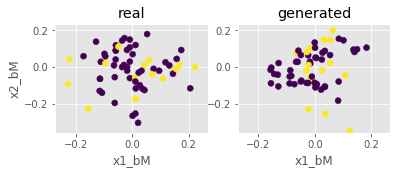

Step: 41200 of 50001.
Losses: G, D Gen, D Real: 2.0240, 0.2531, 0.2330
D Real - D Gen: -0.0202


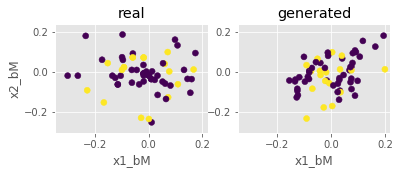

Step: 41300 of 50001.
Losses: G, D Gen, D Real: 2.4233, 0.1941, 0.2279
D Real - D Gen: 0.0338


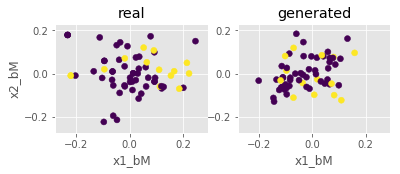

Step: 41400 of 50001.
Losses: G, D Gen, D Real: 2.2627, 0.2093, 0.2221
D Real - D Gen: 0.0127


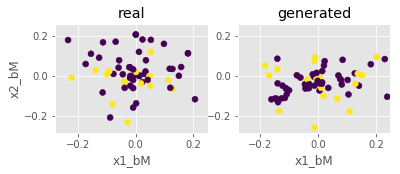

Step: 41500 of 50001.
Losses: G, D Gen, D Real: 2.1590, 0.2026, 0.2433
D Real - D Gen: 0.0407


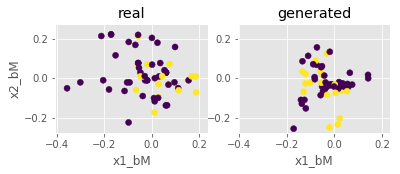

Step: 41600 of 50001.
Losses: G, D Gen, D Real: 2.2083, 0.1956, 0.2382
D Real - D Gen: 0.0427


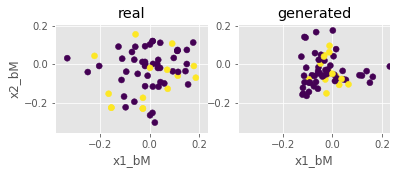

Step: 41700 of 50001.
Losses: G, D Gen, D Real: 2.1122, 0.1935, 0.3135
D Real - D Gen: 0.1199


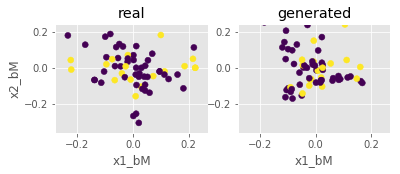

Step: 41800 of 50001.
Losses: G, D Gen, D Real: 2.0644, 0.2816, 0.2449
D Real - D Gen: -0.0367


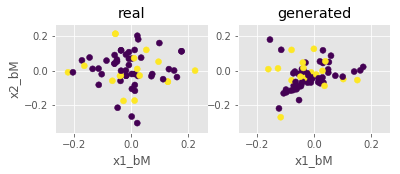

Step: 41900 of 50001.
Losses: G, D Gen, D Real: 2.1309, 0.2256, 0.2028
D Real - D Gen: -0.0228


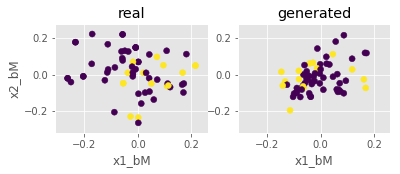

Step: 42000 of 50001.
Losses: G, D Gen, D Real: 2.1812, 0.2255, 0.2149
D Real - D Gen: -0.0106


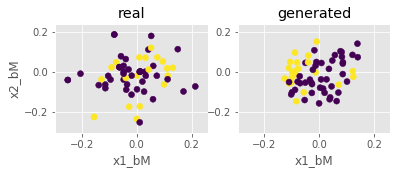

Step: 42100 of 50001.
Losses: G, D Gen, D Real: 2.1228, 0.2009, 0.3097
D Real - D Gen: 0.1088


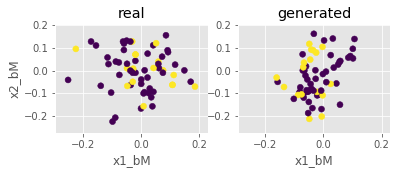

Step: 42200 of 50001.
Losses: G, D Gen, D Real: 2.3720, 0.1899, 0.2492
D Real - D Gen: 0.0593


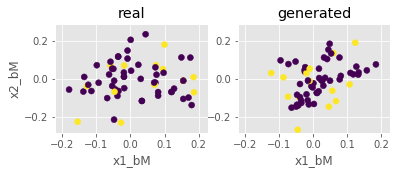

Step: 42300 of 50001.
Losses: G, D Gen, D Real: 2.1610, 0.2022, 0.3177
D Real - D Gen: 0.1155


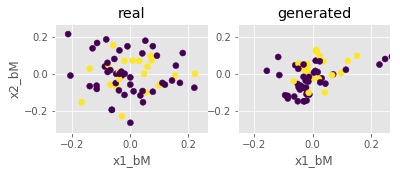

Step: 42400 of 50001.
Losses: G, D Gen, D Real: 2.1274, 0.1561, 0.2907
D Real - D Gen: 0.1346


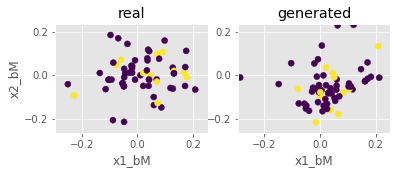

Step: 42500 of 50001.
Losses: G, D Gen, D Real: 2.2518, 0.1978, 0.2878
D Real - D Gen: 0.0900


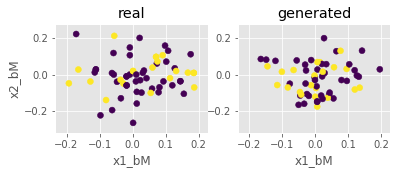

Step: 42600 of 50001.
Losses: G, D Gen, D Real: 2.3319, 0.2154, 0.2868
D Real - D Gen: 0.0715


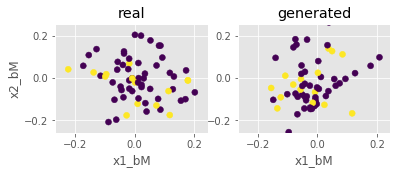

Step: 42700 of 50001.
Losses: G, D Gen, D Real: 2.3942, 0.2469, 0.1654
D Real - D Gen: -0.0814


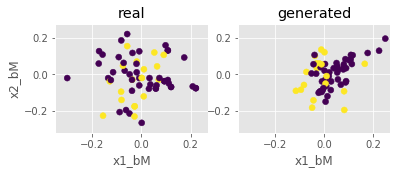

Step: 42800 of 50001.
Losses: G, D Gen, D Real: 2.0497, 0.1878, 0.2388
D Real - D Gen: 0.0510


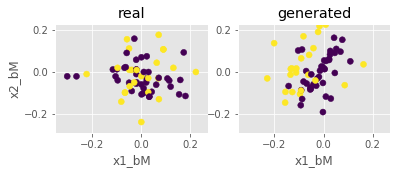

Step: 42900 of 50001.
Losses: G, D Gen, D Real: 2.6142, 0.1859, 0.1541
D Real - D Gen: -0.0318


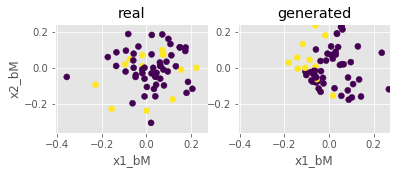

Step: 43000 of 50001.
Losses: G, D Gen, D Real: 2.2645, 0.2002, 0.2585
D Real - D Gen: 0.0583


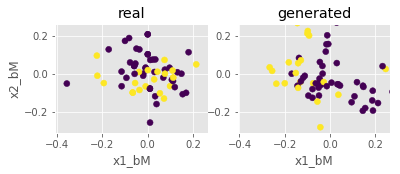

Step: 43100 of 50001.
Losses: G, D Gen, D Real: 2.3640, 0.1436, 0.1647
D Real - D Gen: 0.0211


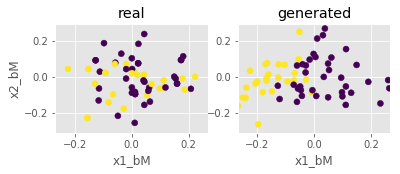

Step: 43200 of 50001.
Losses: G, D Gen, D Real: 2.4767, 0.2290, 0.1802
D Real - D Gen: -0.0488


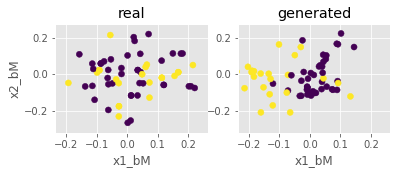

Step: 43300 of 50001.
Losses: G, D Gen, D Real: 2.5510, 0.2210, 0.1855
D Real - D Gen: -0.0356


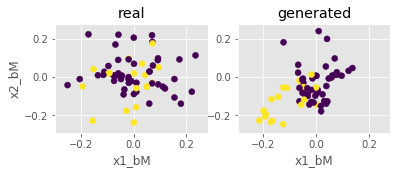

Step: 43400 of 50001.
Losses: G, D Gen, D Real: 2.6514, 0.1532, 0.1882
D Real - D Gen: 0.0349


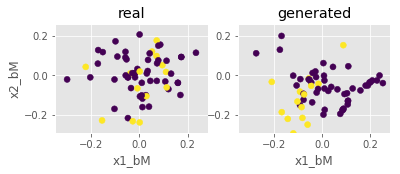

Step: 43500 of 50001.
Losses: G, D Gen, D Real: 2.7063, 0.2321, 0.1685
D Real - D Gen: -0.0636


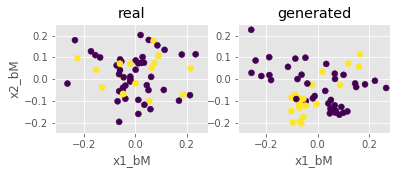

Step: 43600 of 50001.
Losses: G, D Gen, D Real: 2.5914, 0.1859, 0.2117
D Real - D Gen: 0.0258


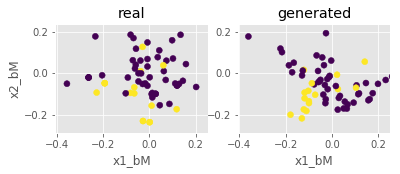

Step: 43700 of 50001.
Losses: G, D Gen, D Real: 2.2396, 0.2012, 0.2366
D Real - D Gen: 0.0354


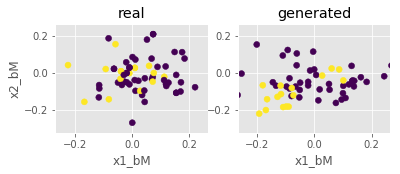

Step: 43800 of 50001.
Losses: G, D Gen, D Real: 2.4440, 0.2639, 0.2195
D Real - D Gen: -0.0444


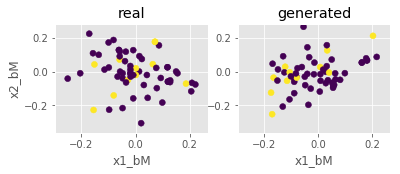

Step: 43900 of 50001.
Losses: G, D Gen, D Real: 2.3425, 0.2153, 0.1906
D Real - D Gen: -0.0247


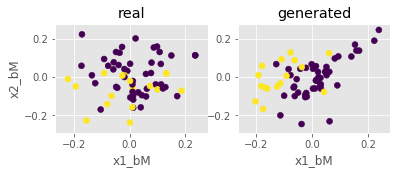

Step: 44000 of 50001.
Losses: G, D Gen, D Real: 2.5372, 0.1818, 0.2775
D Real - D Gen: 0.0957


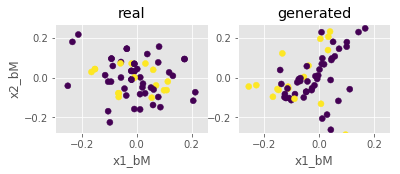

Step: 44100 of 50001.
Losses: G, D Gen, D Real: 2.5021, 0.1602, 0.2894
D Real - D Gen: 0.1292


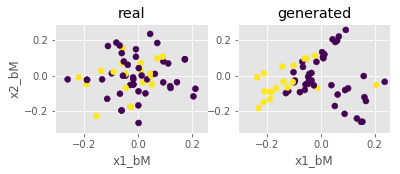

Step: 44200 of 50001.
Losses: G, D Gen, D Real: 2.3297, 0.2106, 0.1324
D Real - D Gen: -0.0781


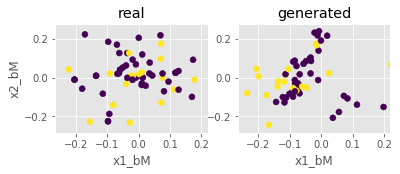

Step: 44300 of 50001.
Losses: G, D Gen, D Real: 2.4227, 0.1622, 0.2818
D Real - D Gen: 0.1196


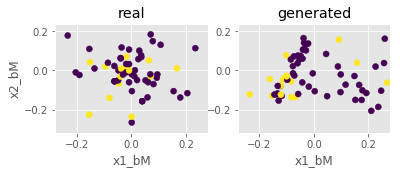

Step: 44400 of 50001.
Losses: G, D Gen, D Real: 2.3821, 0.2092, 0.1632
D Real - D Gen: -0.0459


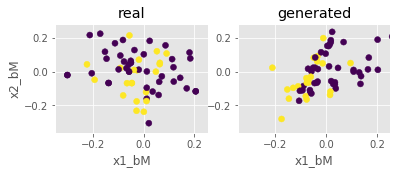

Step: 44500 of 50001.
Losses: G, D Gen, D Real: 2.4445, 0.2172, 0.1553
D Real - D Gen: -0.0619


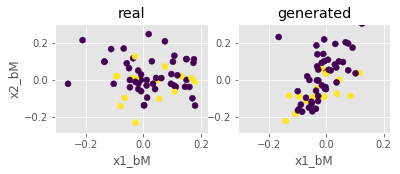

Step: 44600 of 50001.
Losses: G, D Gen, D Real: 2.6797, 0.2181, 0.1519
D Real - D Gen: -0.0661


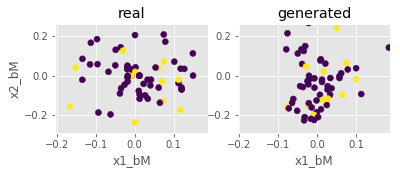

Step: 44700 of 50001.
Losses: G, D Gen, D Real: 2.6025, 0.1668, 0.2066
D Real - D Gen: 0.0398


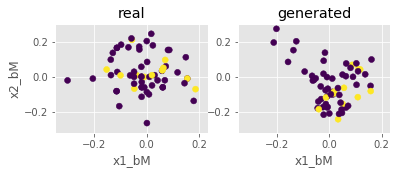

Step: 44800 of 50001.
Losses: G, D Gen, D Real: 2.7632, 0.1971, 0.1288
D Real - D Gen: -0.0683


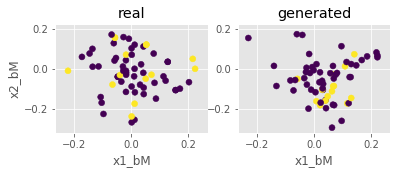

Step: 44900 of 50001.
Losses: G, D Gen, D Real: 2.7178, 0.1815, 0.2253
D Real - D Gen: 0.0438


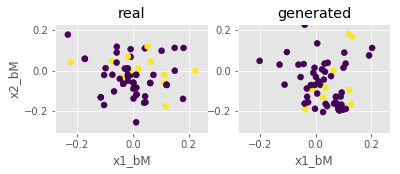

Step: 45000 of 50001.
Losses: G, D Gen, D Real: 2.6277, 0.1850, 0.2270
D Real - D Gen: 0.0420


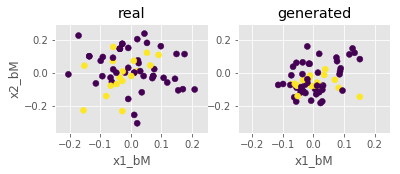

Step: 45100 of 50001.
Losses: G, D Gen, D Real: 2.5633, 0.1435, 0.1457
D Real - D Gen: 0.0023


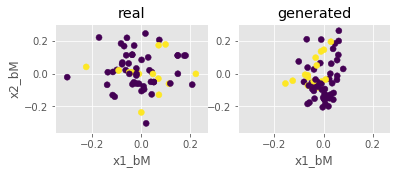

Step: 45200 of 50001.
Losses: G, D Gen, D Real: 2.5915, 0.1770, 0.1980
D Real - D Gen: 0.0210


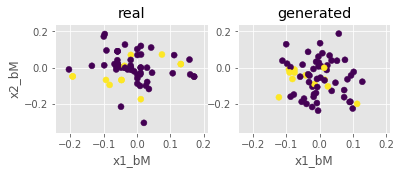

Step: 45300 of 50001.
Losses: G, D Gen, D Real: 2.2000, 0.2483, 0.2611
D Real - D Gen: 0.0128


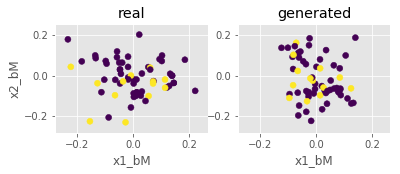

Step: 45400 of 50001.
Losses: G, D Gen, D Real: 2.4042, 0.2503, 0.2014
D Real - D Gen: -0.0489


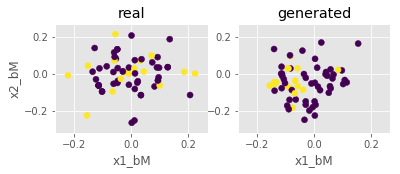

Step: 45500 of 50001.
Losses: G, D Gen, D Real: 2.6870, 0.1847, 0.1918
D Real - D Gen: 0.0071


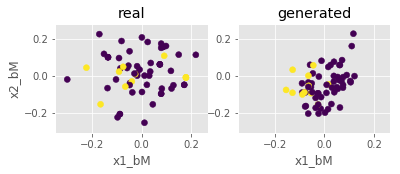

Step: 45600 of 50001.
Losses: G, D Gen, D Real: 2.8320, 0.1728, 0.1666
D Real - D Gen: -0.0062


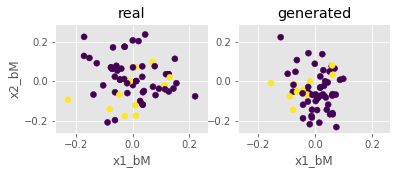

Step: 45700 of 50001.
Losses: G, D Gen, D Real: 2.4936, 0.1450, 0.1742
D Real - D Gen: 0.0292


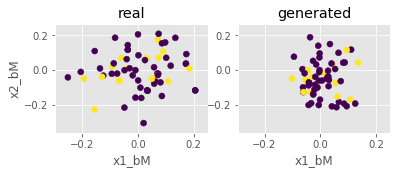

Step: 45800 of 50001.
Losses: G, D Gen, D Real: 2.7208, 0.1294, 0.2619
D Real - D Gen: 0.1325


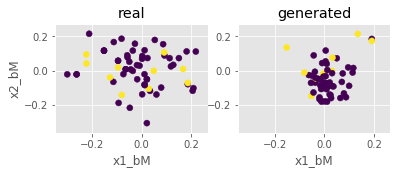

Step: 45900 of 50001.
Losses: G, D Gen, D Real: 2.3423, 0.2235, 0.2345
D Real - D Gen: 0.0110


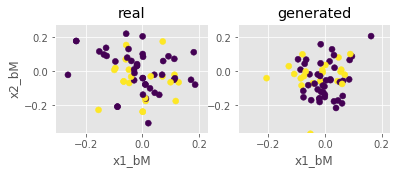

Step: 46000 of 50001.
Losses: G, D Gen, D Real: 2.2592, 0.1782, 0.1881
D Real - D Gen: 0.0100


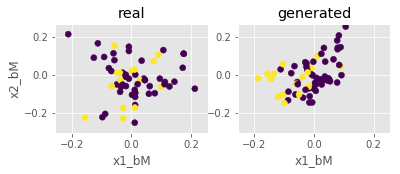

Step: 46100 of 50001.
Losses: G, D Gen, D Real: 2.5961, 0.1617, 0.1763
D Real - D Gen: 0.0147


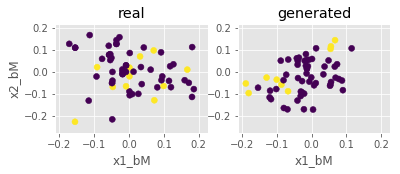

Step: 46200 of 50001.
Losses: G, D Gen, D Real: 2.5574, 0.1405, 0.2160
D Real - D Gen: 0.0755


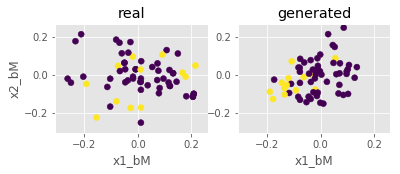

Step: 46300 of 50001.
Losses: G, D Gen, D Real: 2.3523, 0.2325, 0.2085
D Real - D Gen: -0.0240


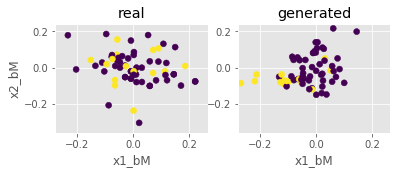

Step: 46400 of 50001.
Losses: G, D Gen, D Real: 2.3863, 0.1979, 0.1989
D Real - D Gen: 0.0010


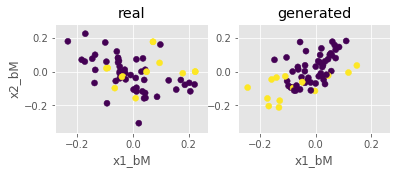

Step: 46500 of 50001.
Losses: G, D Gen, D Real: 2.6601, 0.2160, 0.2098
D Real - D Gen: -0.0062


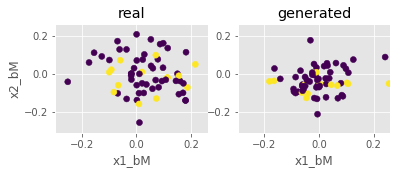

Step: 46600 of 50001.
Losses: G, D Gen, D Real: 2.5611, 0.2156, 0.1958
D Real - D Gen: -0.0198


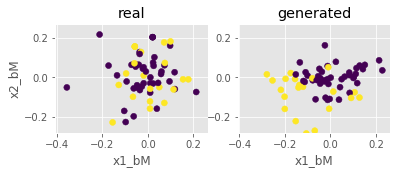

Step: 46700 of 50001.
Losses: G, D Gen, D Real: 2.5990, 0.1863, 0.2669
D Real - D Gen: 0.0806


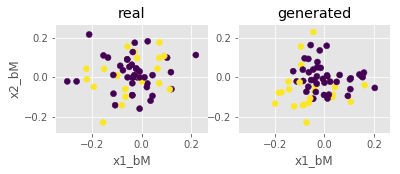

Step: 46800 of 50001.
Losses: G, D Gen, D Real: 2.3584, 0.1926, 0.2882
D Real - D Gen: 0.0956


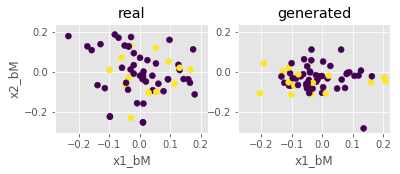

Step: 46900 of 50001.
Losses: G, D Gen, D Real: 2.4657, 0.1542, 0.2388
D Real - D Gen: 0.0846


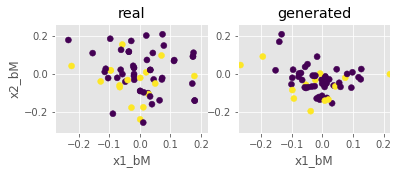

Step: 47000 of 50001.
Losses: G, D Gen, D Real: 2.3768, 0.1906, 0.2024
D Real - D Gen: 0.0118


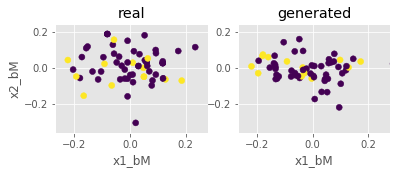

Step: 47100 of 50001.
Losses: G, D Gen, D Real: 2.7109, 0.1966, 0.2108
D Real - D Gen: 0.0142


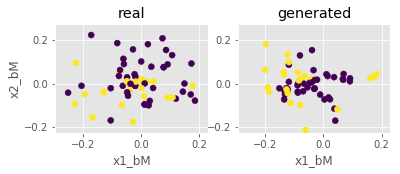

Step: 47200 of 50001.
Losses: G, D Gen, D Real: 2.5402, 0.1620, 0.2340
D Real - D Gen: 0.0720


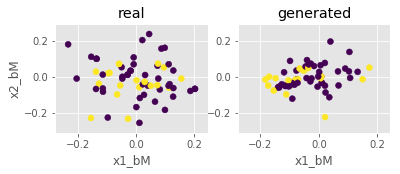

Step: 47300 of 50001.
Losses: G, D Gen, D Real: 2.2195, 0.2227, 0.2231
D Real - D Gen: 0.0004


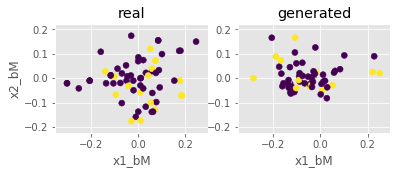

Step: 47400 of 50001.
Losses: G, D Gen, D Real: 2.3144, 0.3810, 0.3179
D Real - D Gen: -0.0631


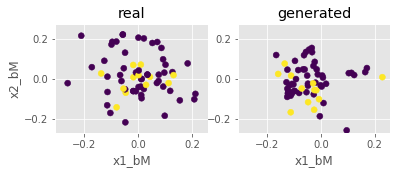

Step: 47500 of 50001.
Losses: G, D Gen, D Real: 2.5061, 0.1842, 0.2590
D Real - D Gen: 0.0747


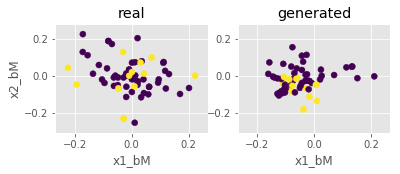

Step: 47600 of 50001.
Losses: G, D Gen, D Real: 2.3813, 0.2033, 0.3489
D Real - D Gen: 0.1457


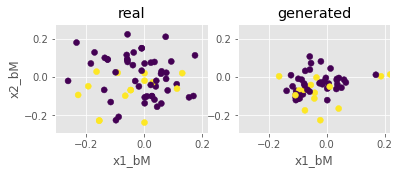

Step: 47700 of 50001.
Losses: G, D Gen, D Real: 2.3597, 0.3293, 0.2449
D Real - D Gen: -0.0844


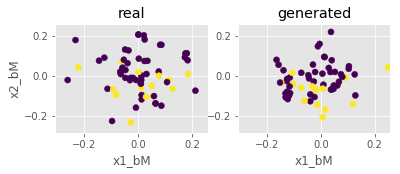

Step: 47800 of 50001.
Losses: G, D Gen, D Real: 2.3188, 0.1979, 0.2900
D Real - D Gen: 0.0921


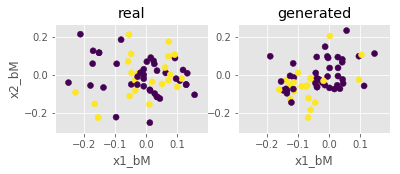

Step: 47900 of 50001.
Losses: G, D Gen, D Real: 2.6157, 0.1659, 0.2669
D Real - D Gen: 0.1011


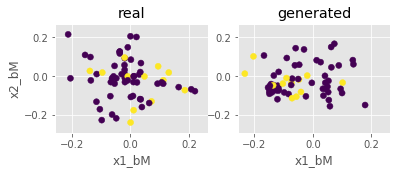

Step: 48000 of 50001.
Losses: G, D Gen, D Real: 2.3819, 0.1768, 0.1949
D Real - D Gen: 0.0181


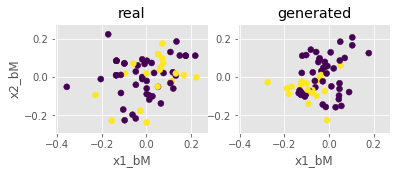

Step: 48100 of 50001.
Losses: G, D Gen, D Real: 2.1700, 0.2222, 0.2216
D Real - D Gen: -0.0006


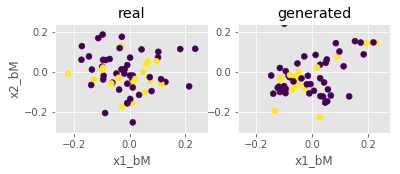

Step: 48200 of 50001.
Losses: G, D Gen, D Real: 2.6932, 0.1672, 0.2172
D Real - D Gen: 0.0499


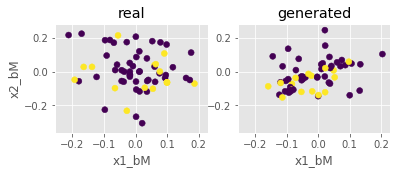

Step: 48300 of 50001.
Losses: G, D Gen, D Real: 2.6865, 0.2120, 0.1964
D Real - D Gen: -0.0156


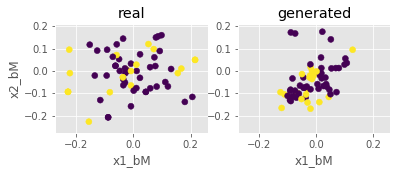

Step: 48400 of 50001.
Losses: G, D Gen, D Real: 2.4390, 0.2689, 0.2017
D Real - D Gen: -0.0672


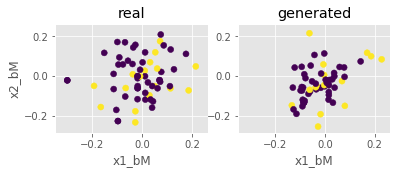

Step: 48500 of 50001.
Losses: G, D Gen, D Real: 2.3219, 0.3562, 0.2956
D Real - D Gen: -0.0606


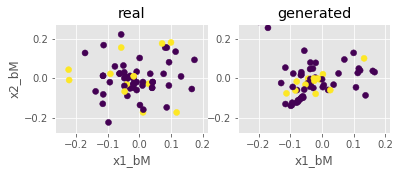

Step: 48600 of 50001.
Losses: G, D Gen, D Real: 2.3585, 0.2404, 0.3306
D Real - D Gen: 0.0902


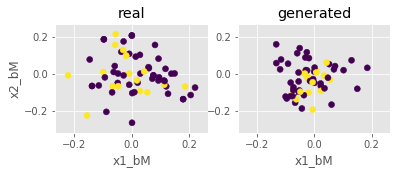

Step: 48700 of 50001.
Losses: G, D Gen, D Real: 2.3397, 0.2001, 0.2632
D Real - D Gen: 0.0632


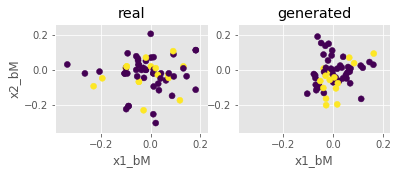

Step: 48800 of 50001.
Losses: G, D Gen, D Real: 2.5638, 0.1812, 0.1611
D Real - D Gen: -0.0201


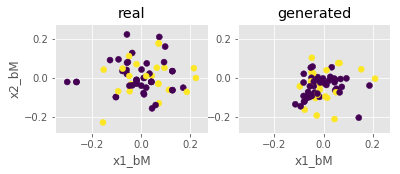

Step: 48900 of 50001.
Losses: G, D Gen, D Real: 2.2210, 0.1568, 0.2207
D Real - D Gen: 0.0639


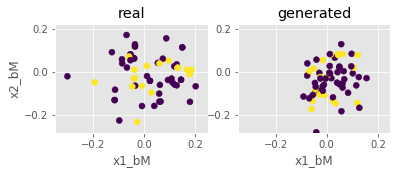

Step: 49000 of 50001.
Losses: G, D Gen, D Real: 2.5787, 0.1694, 0.2210
D Real - D Gen: 0.0516


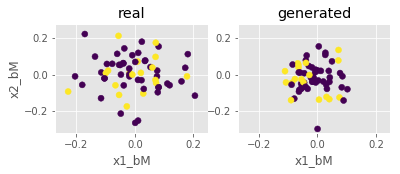

Step: 49100 of 50001.
Losses: G, D Gen, D Real: 2.3904, 0.1755, 0.2404
D Real - D Gen: 0.0649


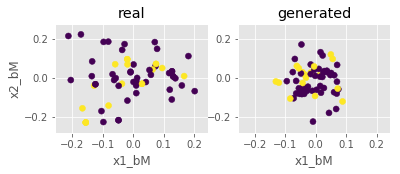

Step: 49200 of 50001.
Losses: G, D Gen, D Real: 2.4257, 0.2351, 0.2211
D Real - D Gen: -0.0141


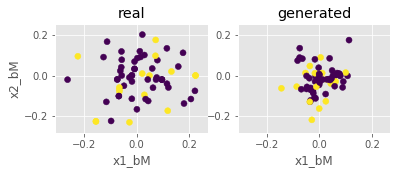

Step: 49300 of 50001.
Losses: G, D Gen, D Real: 2.4064, 0.2474, 0.2195
D Real - D Gen: -0.0280


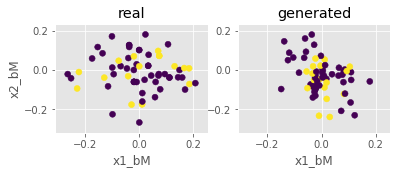

Step: 49400 of 50001.
Losses: G, D Gen, D Real: 2.5862, 0.1992, 0.1995
D Real - D Gen: 0.0003


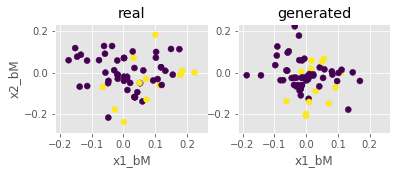

Step: 49500 of 50001.
Losses: G, D Gen, D Real: 2.4865, 0.1364, 0.2239
D Real - D Gen: 0.0875


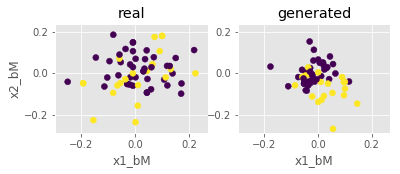

Step: 49600 of 50001.
Losses: G, D Gen, D Real: 2.3184, 0.2030, 0.1721
D Real - D Gen: -0.0310


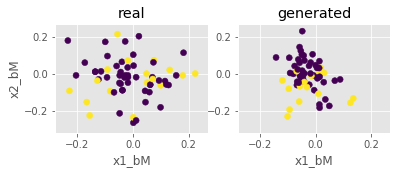

Step: 49700 of 50001.
Losses: G, D Gen, D Real: 2.5946, 0.1801, 0.2375
D Real - D Gen: 0.0574


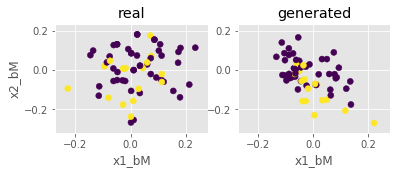

Step: 49800 of 50001.
Losses: G, D Gen, D Real: 2.6205, 0.2369, 0.2521
D Real - D Gen: 0.0152


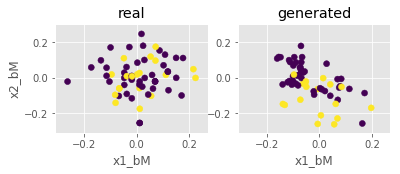

Step: 49900 of 50001.
Losses: G, D Gen, D Real: 2.6030, 0.2941, 0.2887
D Real - D Gen: -0.0054


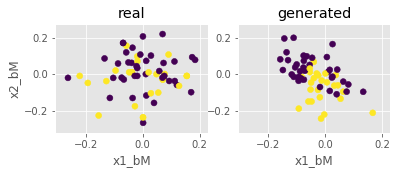

Step: 50000 of 50001.
Losses: G, D Gen, D Real: 2.7881, 0.1545, 0.2305
D Real - D Gen: 0.0760


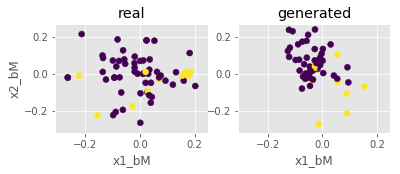

ValueError: not enough values to unpack (expected 4, got 3)

In [43]:
%%time

# Training the CGAN architecture

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-5 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

# Generated Data

In [45]:
# Let's look at some of the generated data
# First create the networks locally and load the weights

import CGAN
import importlib
importlib.reload(CGAN) # For reloading after making changes
from CGAN import *

rand_dim = 100 
base_n_count = 30 
seed = 17

data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = False
if label_dim > 0: with_class = True
np.random.seed(seed)

# define network models

generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
generator_model.load_weights('./cache/terremotos/CGAN_generator_model_weights_step_50000.h5')


In [52]:
# Now generate some new data

test_size = 991 

#x = get_data_batch(train, test_size)
z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = data[label_cols]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

In [ ]:
real_samples = data
fake_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)

real_samples.to_excel('./data/terremotos/real_terremotos.xlsx')
fake_samples.to_excel('./data/terremotos/fake.xlsx')

In [2]:
real_samples = pd.read_excel('./data/terremotos/real_terremotos.xlsx')
fake_samples = pd.read_excel('./data/terremotos/fake.xlsx')

# Correlation between variables of two datasets

## Pearson Correlation Index

In [3]:
pearson = real_samples.corrwith(fake_samples)
pearson.to_excel('./res.xlsx')
pearson


x1_bM             0.058257
x2_bM             0.058855
x3_bM            -0.063054
x4_bM             0.019863
x5_bM             0.072820
x6_indep_bM      -0.015116
x7_bM            -0.031746
T3.6_indep_bM     0.010969
T3.7_indep_bM     0.014378
T3.8_indep_bM     0.012541
T3.9_indep_bM     0.027992
T4_indep_bM       0.013889
T4.1_indep_bM     0.009565
T4.2_indep_bM     0.000024
T4.3_indep_bM    -0.009646
T4.4_indep_bM     0.012188
T4.5_indep_bM     0.029610
T4.6_indep_bM     0.030324
T4.7_indep_bM    -0.048120
T4.8_indep_bM    -0.040793
T4.9_indep_bM     0.018731
T5_indep_bM       0.014200
T5.1_indep_bM    -0.000012
T5.2_indep_bM    -0.006005
T5.3_indep_bM    -0.017959
T5.4_indep_bM    -0.002578
T5.5_indep_bM     0.010824
T5.6_indep_bM     0.055130
T5.7_indep_bM     0.062210
T5.8_indep_bM     0.043831
                    ...   
mu6.1_indep_bM         NaN
mu6.2_indep_bM         NaN
c3.6_indep_bM          NaN
c3.7_indep_bM          NaN
c3.8_indep_bM          NaN
c3.9_indep_bM          NaN
c

In [57]:
pearson = pearson.dropna()

## Covariance

In [59]:
columnas = real_samples.columns.values
covarianza = []
for col in columnas:
    covarianza.append(np.cov(real_samples[col], fake_samples[col])[0][1])
    print(col + ":       " +  str(np.cov(real_samples[col], fake_samples[col])[0][1]))
    
pd.Series(covarianza).to_excel('./res.xlsx')
    

x1_bM:       0.0033891969750247477
x2_bM:       0.0053583529512687775
x3_bM:       -0.007838022769235146
x4_bM:       0.0019504985845356256
x5_bM:       0.006047918314203977
x6_indep_bM:       -0.0010167013882273295
x7_bM:       -0.003133009456110431
T3.6_indep_bM:       0.0007700347050351943
T3.7_indep_bM:       0.000989047712854758
T3.8_indep_bM:       0.0008373184623587394
T3.9_indep_bM:       0.001775090236664113
T4_indep_bM:       0.001090507730944343
T4.1_indep_bM:       0.00058104149882106
T4.2_indep_bM:       1.4791340921475643e-06
T4.3_indep_bM:       -0.000673061878739739
T4.4_indep_bM:       0.0008846765004911818
T4.5_indep_bM:       0.0023964563161858127
T4.6_indep_bM:       0.0024438641297761642
T4.7_indep_bM:       -0.0035553987445466778
T4.8_indep_bM:       -0.0036574117220275334
T4.9_indep_bM:       0.002215024144979699
T5_indep_bM:       0.0015866000165055206
T5.1_indep_bM:       -1.3316463729687676e-06
T5.2_indep_bM:       -0.0005883497014254353
T5.3_indep_bM:       -

## Spearman's Correlation

In [60]:
from scipy.stats import spearmanr
columnas = real_samples.columns.values
spearman = []
for col in columnas:
    spr, _ = spearmanr(real_samples[col], fake_samples[col])
    spearman.append(spr)
    print(col + ":       " + str(spr) )
    
pd.Series(spearman).to_excel('./res.xlsx')

x1_bM:       0.05239114319088541
x2_bM:       0.04776101351034066
x3_bM:       -0.051040382844745345
x4_bM:       0.032202256924908454
x5_bM:       0.07130211021367099
x6_indep_bM:       -0.043594177816424606
x7_bM:       0.005965910290363221
T3.6_indep_bM:       0.014377097134253971
T3.7_indep_bM:       0.011424574536882424
T3.8_indep_bM:       0.010798703886884283
T3.9_indep_bM:       0.023979908516675193
T4_indep_bM:       0.023382600302990306
T4.1_indep_bM:       0.004960254642217156
T4.2_indep_bM:       -0.005799902935788431
T4.3_indep_bM:       -0.01441185099534043
T4.4_indep_bM:       0.02401791546118419
T4.5_indep_bM:       0.05631473856211487
T4.6_indep_bM:       0.0597222858266776
T4.7_indep_bM:       -0.04760657514110594
T4.8_indep_bM:       -0.01440998148536734
T4.9_indep_bM:       0.04496738610100641
T5_indep_bM:       0.04978354977644192
T5.1_indep_bM:       0.02947159813858356
T5.2_indep_bM:       0.008749634003642232
T5.3_indep_bM:       -0.005229750429703002
T5.4_indep

C:\Programas\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2400: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Programas\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2401: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Programas\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Programas\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Programas\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


# XGBoost

## CV with real data

In [25]:
xgbo_cv(data[data_cols], data[label_cols].values.ravel())

Accuracy XGBoost CV:  0.9637581848637126
F1-Score XGBoost CV:  0.9254905808477236
ROC AUC XGBoost CV:  0.9810343957402781


## CV with generated data

In [69]:
# Generated data
X = fake_samples.drop(columns=["class5"])
y = fake_samples["class5"]
xgbo_cv(X, y.values.ravel())

Accuracy XGBoost CV:  0.9889142683112532
F1-Score XGBoost CV:  0.9780137990022502
ROC AUC XGBoost CV:  0.9996813139670282


## CV with the two datasets joined

In [61]:
from sklearn.utils import shuffle
data = pd.concat([real_samples, fake_samples])
data = shuffle(data)
data.to_excel('./data/terremotos/real_fake.xlsx')

In [62]:
xgbo_cv(data.drop(columns=['class5']), data.class5.values.ravel())

Accuracy XGBoost CV:  0.961646693636618
F1-Score XGBoost CV:  0.9230658439920065
ROC AUC XGBoost CV:  0.9887213190360888
